# PROBLEM STATEMENT
* **DOMAIN**: Food Industry.  
* **CONTEXT:**
Computer Vision (CV) technologies have revolutionized automation in various industries, including the food industry. In this project, we explore the use of deep learning-based computer vision models to automatically identify food items from images. Such identification can be used to trigger appropriate actions or alerts based on the type, color, or presence of specific food ingredients. Automating the recognition of food items can be especially useful in environments like kitchens, restaurants, food-delivery platforms, or dietary tracking applications.

• **DATA DESCRIPTION:**
*  We use the Food101 dataset, which contains a total of 16,256 images spanning across 17 classes of food items. Each food category (e.g., apple_pie, sushi, hamburger) includes a diverse range of image samples with natural variations in lighting, background, and presentation.

## For the scope of Milestone 1:
* We have selected 10 food classes from the dataset.
* For each selected class, 50 images have been extracted for training and annotation purposes.
* The dataset has been split into training and testing sets, maintaining approximately a 70:30 ratio.

These images were manually annotated using a standard image annotation tool to identify and localize the food object within each image. These annotations are used for displaying bounding boxes and training object detection models in the subsequent milestones.

#### **PROJECT OBJECTIVE:** Design a DL based Food identification model




### Importing the libraries

In [ ]:
# Importing the libraries
# Standard libraries
import os
import random
import json
import re
from collections import defaultdict

# File handling and image processing
import zipfile
from PIL import Image
import cv2

# Data manipulation and visualization
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from IPython.display import clear_output
%matplotlib inline

# Machine learning and deep learning
from sklearn.model_selection import train_test_split
import torch
import tensorflow as tf

In [ ]:
#Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

#Logic to accesss shared folder in Google Drive using shortcuts

#Set Project base path
project_path = '/content/drive/MyDrive/shortcuts/Gr 6 CV3 - CapStone Project/Capstone_Project/'
#project_path = '/content/drive/MyDrive/shortcuts/Capstone/'

Mounted at /content/drive


#### Extract Image Data

In [ ]:
# Define the path to the zip file and the extraction directory
zip_file_path = project_path + 'Food_101.zip'
food_dir = project_path + 'Food_101'

# Extract the zip file if the directory doesn't exist
if not os.path.exists(food_dir):
    print(f"Extracting '{zip_file_path}' to '{food_dir}'...")
    #with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    #    zip_ref.extractall(project_path)
    print("Extraction complete.")
else:
    print(f"Directory '{food_dir}' already exists. Skipping extraction.")

Directory '/content/drive/MyDrive/shortcuts/Gr 6 CV3 - CapStone Project/Capstone_Project/Food_101' already exists. Skipping extraction.


In [ ]:
# Function to read images and extract labels
def load_food_data(food_dir):
    image_paths = []
    labels = []
    for folder_name in os.listdir(food_dir):
      folder_path = os.path.join(food_dir, folder_name)
      if os.path.isdir(folder_path):
          for image_file in os.listdir(folder_path):
            if image_file.lower().endswith(('.png', '.jpg', '.jpeg')): # Check for image extensions
                image_path = os.path.join(folder_path, image_file)
                try:
                    image_path = os.path.join(folder_path, image_file)
                    image_paths.append(image_path)
                    labels.append(folder_name)  # Use folder name as label
                except Exception as e:
                    print(f"Error processing image {image_path}: {e}")
    return image_paths, labels

image_paths, labels = load_food_data(food_dir)

# Check number of loaded images and labels
print(f"Number of images loaded : {len(image_paths)}")
print(f"Number of labels loaded : {len(labels)}")

Number of images loaded : 16253
Number of labels loaded : 16253


## **Exploratory Data Analysis (EDA)**

#### **Visualizing Sample Images**

In [ ]:
# Display random images with their labels
def display_random_images(image_paths, labels, num_images=5):
    """
    Displays a random selection of images with their corresponding labels.

    Args:
        image_paths (list): List of image file paths.
        labels (list): List of labels corresponding to the images.
        num_images (int): Number of random images to display.
    """
    if not image_paths or not labels:
        print("No images or labels to display.")
        return

    # Randomly select indices
    random_indices = random.sample(range(len(image_paths)), min(num_images, len(image_paths)))

    plt.figure(figsize=(15, 8))
    for i, idx in enumerate(random_indices):
        try:
            img = cv2.imread(image_paths[idx])
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib
            plt.subplot(1, num_images, i + 1)
            plt.imshow(img)
            plt.title(labels[idx])
            plt.axis('off')
        except Exception as e:
            print(f"Error loading or displaying image {image_paths[idx]}: {e}")
    plt.tight_layout()
    plt.show()

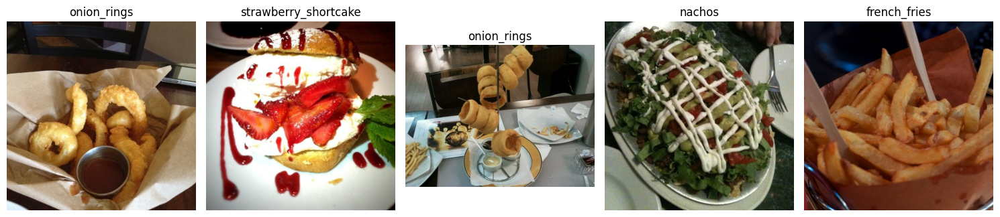

In [ ]:
# Display 5 random images
display_random_images(image_paths, labels, num_images=5)

#### **Observations**

- The images in the dataset have varying sizes and aspect ratios, as observed. To ensure compatibility with the model, we need to resize the images to a consistent size before model building

#### **Identify Classes**

In [ ]:
# Automatically extract food classes by listing subdirectories
try:
    all_classes = sorted([d for d in os.listdir(food_dir) if os.path.isdir(os.path.join(food_dir, d))])
    print(f"Found the following food classes: {all_classes}")
except FileNotFoundError:
    print(f"Error: Food directory not found at {food_dir}. Please ensure the path is correct.")
    exit()

selected_classes = all_classes  # Use all found classes

Found the following food classes: ['apple_pie', 'chocolate_cake', 'donuts', 'falafel', 'french_fries', 'hot_dog', 'ice_cream', 'nachos', 'onion_rings', 'pancakes', 'pizza', 'ravioli', 'samosa', 'spring_rolls', 'strawberry_shortcake', 'tacos', 'waffles']


#### **Understanding Dataset Composition**

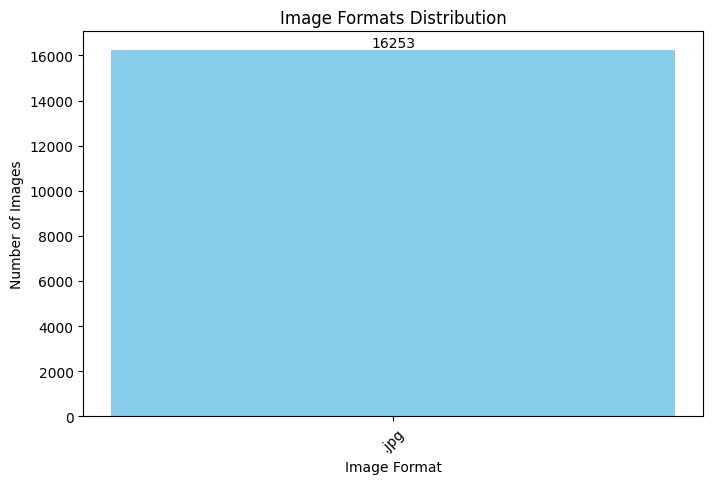

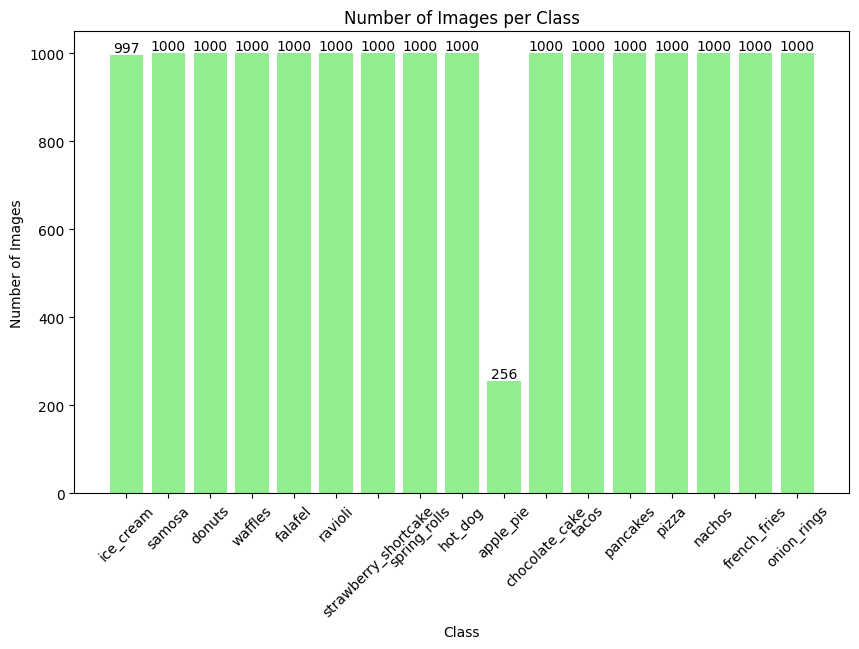

In [ ]:
import os
from collections import Counter
import matplotlib.pyplot as plt

def analyze_images(image_paths, labels):
    # Count image formats based on file extensions
    formats = Counter()
    for image_path in image_paths:
        ext = os.path.splitext(image_path)[1].lower()  # Get file extension
        formats[ext] += 1

    # Count number of images per class
    class_counts = Counter(labels)

    return formats, class_counts

# Analyze the data
formats, class_counts = analyze_images(image_paths, labels)

# Visualize Image Formats
def visualize_image_formats(formats):
    plt.figure(figsize=(8, 5))
    bars = plt.bar(formats.keys(), formats.values(), color='skyblue')
    plt.title("Image Formats Distribution")
    plt.xlabel("Image Format")
    plt.ylabel("Number of Images")
    plt.xticks(rotation=45)

    # Add annotations (numbers) on top of the bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height, str(height), ha='center', va='bottom')

    plt.show()

# Visualize Number of Images per Class
def visualize_class_distribution(class_counts):
    plt.figure(figsize=(10, 6))
    bars = plt.bar(class_counts.keys(), class_counts.values(), color='lightgreen')
    plt.title("Number of Images per Class")
    plt.xlabel("Class")
    plt.ylabel("Number of Images")
    plt.xticks(rotation=45)

    # Add annotations (numbers) on top of the bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height, str(height), ha='center', va='bottom')

    plt.show()

# Call visualization functions
visualize_image_formats(formats)
visualize_class_distribution(class_counts)

#### **Observations**
- All Images are of type JPG
- Apple pie has only 256 images, ice_cream has 997 while all other classes have 1000 images - there is a class imbalance here.

#### **Load training and test annotations**

In [ ]:
# Function to extract bounding box data from COCO annotations
def extract_bounding_box_data(annotation_file_path):
    """
    Extracts bounding box data from a COCO JSON annotation file.

    Args:
        annotation_file_path (str): Path to the COCO JSON annotation file.

    Returns:
        dict: A dictionary where keys are image file names and values are lists of bounding box data.
              Each bounding box data is a dictionary with 'class_name' and 'bbox' (x, y, width, height).
    """
    try:
        with open(annotation_file_path, 'r') as f:
            coco_data = json.load(f)
    except FileNotFoundError:
        print(f"Error: File not found at {annotation_file_path}")
        return {}

    # Create a mapping of category_id to class names
    category_id_to_name = {category['id']: category['name'] for category in coco_data['categories']}

    # Create a mapping of image_id to file names
    image_id_to_file_name = {image['id']: image['file_name'] for image in coco_data['images']}

    # Extract bounding box data
    bounding_box_data = {}
    for annotation in coco_data['annotations']:
        image_id = annotation['image_id']
        category_id = annotation['category_id']
        bbox = annotation['bbox']  # [x, y, width, height]

        # Map category_id and image_id to their respective names
        class_name = category_id_to_name.get(category_id)
        image_file_name = image_id_to_file_name.get(image_id)
        # Update the filename to remove the ".rf.<hash>" part
        image_file_name = re.sub(r'_.*', '.jpg', image_file_name)

        if class_name and image_file_name:
            if image_file_name not in bounding_box_data:
                bounding_box_data[image_file_name] = []
            bounding_box_data[image_file_name].append({
                'class_name': class_name,
                'bbox': bbox
            })

    return bounding_box_data

In [ ]:
# Get training Bounding box data
train_annotation_file = project_path + 'fooddetection-cap-cv3-may24b.v7i.coco/train/_annotations.coco.json'
train_bounding_box_data = extract_bounding_box_data(train_annotation_file)

# Get testing Bounding box data
test_annotation_file = project_path + 'fooddetection-cap-cv3-may24b.v7i.coco/test/_annotations.coco.json'
test_bounding_box_data = extract_bounding_box_data(test_annotation_file)

#### Display images with label and bounding box

In [ ]:
# Get annotated training and test data image paths
annotated_training_image_paths = []
annotated_testing_image_paths = []
for image_path in image_paths:
    image_file_name = os.path.basename(image_path)
    # Check if the image has bounding box data
    if image_file_name in train_bounding_box_data:
        annotated_training_image_paths.append(image_path)
    # Check if the image has bounding box data
    if image_file_name in test_bounding_box_data:
        annotated_testing_image_paths.append(image_path)

In [ ]:
# Function to display 5 images with bounding boxes in a subplot
def display_sample_images_with_bounding_boxes(image_paths, bounding_box_data, num_images=5):
    """
    Displays a random selection of images with bounding boxes in a subplot.

    Args:
        image_paths (list): List of image file paths.
        bounding_box_data (dict): Dictionary where keys are image file names and values are lists of bounding box data.
        num_images (int): Number of images to display in the subplot.
    """
    # Filter image paths that have bounding box data
    annotated_image_paths = [path for path in image_paths if os.path.basename(path) in bounding_box_data]

    # Randomly select a subset of images
    selected_image_paths = random.sample(annotated_image_paths, min(num_images, len(annotated_image_paths)))

    # Create a subplot
    plt.figure(figsize=(15, 10))
    for i, image_path in enumerate(selected_image_paths):
        image_file_name = os.path.basename(image_path)
        bounding_boxes = bounding_box_data[image_file_name]

        # Open the image
        image = Image.open(image_path)

        # Add the image to the subplot
        ax = plt.subplot(1, num_images, i + 1)
        ax.imshow(image)
        ax.axis('off')

        # Add bounding boxes to the image
        for box in bounding_boxes:
            class_name = box['class_name']
            x, y, width, height = box['bbox']

            # Create a rectangle patch
            rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)

        # Add the label (class name) as the title of the subplot
        ax.set_title(bounding_boxes[0]['class_name'], fontsize=12, color='blue')

    plt.tight_layout()
    plt.show()

##### **Display training images with bounding box and label**

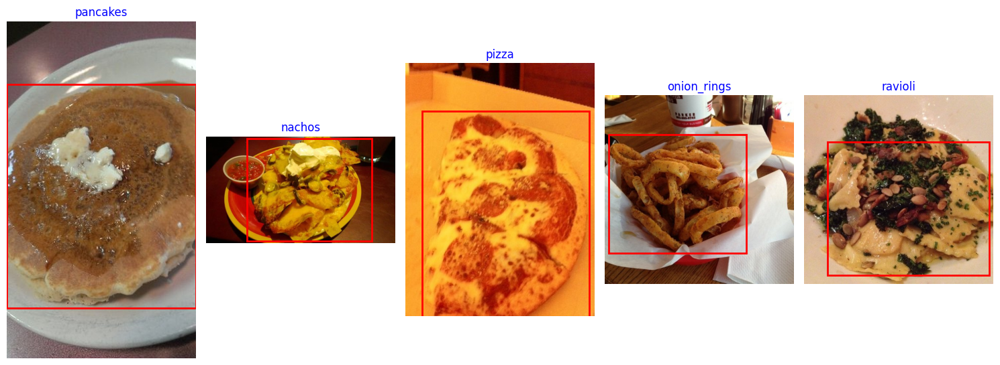

In [ ]:
# Display random training images with bounding box
display_sample_images_with_bounding_boxes(annotated_training_image_paths, train_bounding_box_data, num_images=5)

##### **Display test images with bounding box and label**

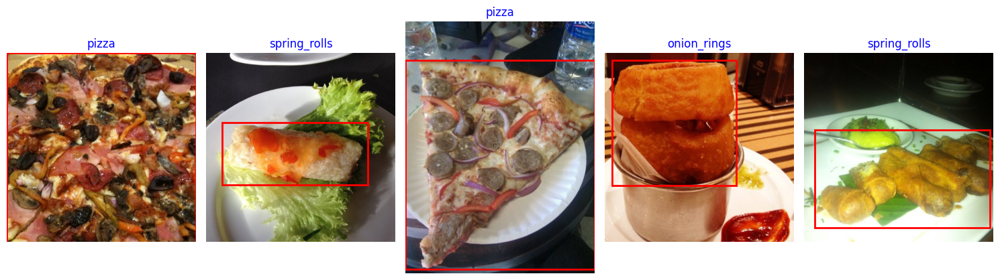

In [ ]:
# Display random test images with bounding box
display_sample_images_with_bounding_boxes(annotated_testing_image_paths, test_bounding_box_data, num_images=5)

## Model Building

#### **Generate Test and Train Data**

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.callbacks import ModelCheckpoint
import os

# Parameters
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32
NUM_CLASSES = 17
DATA_DIR = food_dir  # Dataset folder with subfolders per class

# Directory to save model weights
checkpoint_dir = os.path.join(project_path, "EfficientNetB0-checkpoints")
os.makedirs(checkpoint_dir, exist_ok=True)

# Path to save the model weights
checkpoint_path = os.path.join(checkpoint_dir, "model_epoch_{epoch:02d}.weights.h5")

# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=20,  # Rotate images up to 20 degrees
    width_shift_range=0.2,  # Shift images horizontally by 20% of the width
    height_shift_range=0.2,  # Shift images vertically by 20% of the height
    shear_range=0.2,  # Apply shear transformations with a 20% intensity
    horizontal_flip=True,  # Flip images horizontally
    validation_split=0.3  # 20% validation split
)

# Create a training data generator
train_generator = train_datagen.flow_from_directory(
    DATA_DIR,
    target_size=IMAGE_SIZE, # Resize images to the specified size
    batch_size=BATCH_SIZE, # Number of images to process in a batch
    class_mode='categorical',
    subset='training',
    shuffle=True # Shuffle the training data for better generalization
)

# Create a validation data generator
validation_generator = train_datagen.flow_from_directory(
    DATA_DIR,
    target_size=IMAGE_SIZE, # Resize images to the specified size
    batch_size=BATCH_SIZE, # Number of images to process in a batch
    class_mode='categorical',
    subset='validation',
    shuffle=False # Do not shuffle validation data to maintain order
)


Found 11378 images belonging to 17 classes.
Found 4875 images belonging to 17 classes.


- Using **EfficientNet** as the base model

In [ ]:
# Load EfficientNetB0 base model without top layer
base_model = EfficientNetB0(include_top=False, input_shape=IMAGE_SIZE + (3,), weights='imagenet')
# Freeze base model
base_model.trainable = False

# Build the classification head on top of the base model
# Define the input layer with the same shape as the input images
inputs = layers.Input(shape=IMAGE_SIZE + (3,))
# Pass the inputs through the base model (EfficientNetB0) without updating its weights
x = base_model(inputs, training=False)
# Apply global average pooling to reduce the spatial dimensions
x = layers.GlobalAveragePooling2D()(x)
# Add a dropout layer to reduce overfitting
x = layers.Dropout(0.3)(x)
# Add the output layer with the number of classes and softmax activation for classification
outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)
model = models.Model(inputs, outputs)

# Compile the model with the Adam optimizer, categorical crossentropy loss, and accuracy metric
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

- ***Train the model and resume training from last run run in case training was stopped in between***

In [ ]:
# Check if there are any saved weights to resume training
latest_checkpoint = None
epochs_completed = 0  # Default to 0 if no checkpoint is found

if os.path.exists(checkpoint_dir) and os.listdir(checkpoint_dir):
    # Find the latest checkpoint file
    checkpoint_files = [
        f for f in os.listdir(checkpoint_dir) if f.endswith(".h5")
    ]
    if checkpoint_files:
        latest_checkpoint = max(
            [os.path.join(checkpoint_dir, f) for f in checkpoint_files],
            key=os.path.getctime
        )
        # Extract the epoch number from the checkpoint filename
        import re
        match = re.search(r"epoch_(\d+)", latest_checkpoint)
        if match:
            epochs_completed = int(match.group(1))
        print(f"Resuming training from epoch {epochs_completed}. Loading weights from: {latest_checkpoint}")
        model.load_weights(latest_checkpoint)
    else:
        print("No checkpoint found. Starting training from scratch.")
else:
    print("No checkpoint directory found. Starting training from scratch.")

# Callback to save model weights at every epoch
checkpoint_path = os.path.join(checkpoint_dir, "model_epoch_{epoch:02d}.weights.h5")
checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=True,  # Save only weights
    save_best_only=False,    # Save weights at every epoch
    verbose=1
)

# Train model (feature extraction)
total_epochs = 10  # Total epochs you want to train
remaining_epochs = total_epochs - epochs_completed

if remaining_epochs > 0:
    print(f"Training with remaining epochs: {remaining_epochs}")
    # Train the model starting from the last completed epoch and save weights at each epoch
    history = model.fit(
        train_generator,
        validation_data=validation_generator,
        epochs=epochs_completed + remaining_epochs,  # Total epochs to train
        initial_epoch=epochs_completed,  # Start from the last completed epoch
        callbacks=[checkpoint_callback], # Save model weights at each epoch
        verbose=1  # Ensure logs are displayed
    )
else:
    print("Training is already complete. No remaining epochs to train.")

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
No checkpoint found. Starting training from scratch.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.5188 - loss: 1.7030 
Epoch 1: saving model to /content/drive/MyDrive/shortcuts/Capstone/checkpoints/model_epoch_01.weights.h5
356/356 ━━━━━━━━━━━━━━━━━━━━ 5385s 15s/step - accuracy: 0.5192 - loss: 1.7018 - val_accuracy: 0.7689 - val_loss: 0.8104
Epoch 2/10
356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 553ms/step - accuracy: 0.7511 - loss: 0.8361
Epoch 2: saving model to /content/drive/MyDrive/shortcuts/Capstone/checkpoints/model_epoch_02.weights.h5
356/356 ━━━━━━━━━━━━━━━━━━━━ 280s 787ms/step - accuracy: 0.7511 - loss: 0.8361 - val_accuracy: 0.7853 - val_loss: 0.7186
Epoch 3/10
356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 550ms/step - accuracy: 0.7814 - loss: 0.7189
Epoch 3: saving model to /content/drive/MyDrive/shortcuts/Capstone/checkpoints/model_epoch_03.weights.h5
356/356 ━━━━━━━━━━━━━━━━━━━━ 279s 783ms/step - accuracy: 0.7814 - loss: 0.7189 - val_accuracy: 0.7931 - val_loss: 0.6671
Epoch 4/10
356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 542ms/step - accu

#### **Plot Training History**

/content/drive/MyDrive/shortcuts/Gr 6 CV3 - CapStone Project/Capstone_Project/EfficientNetB0-checkpoints/training_history.json
Loading existing training history from: /content/drive/MyDrive/shortcuts/Gr 6 CV3 - CapStone Project/Capstone_Project/EfficientNetB0-checkpoints/training_history.json
No new training history found. Using existing history.


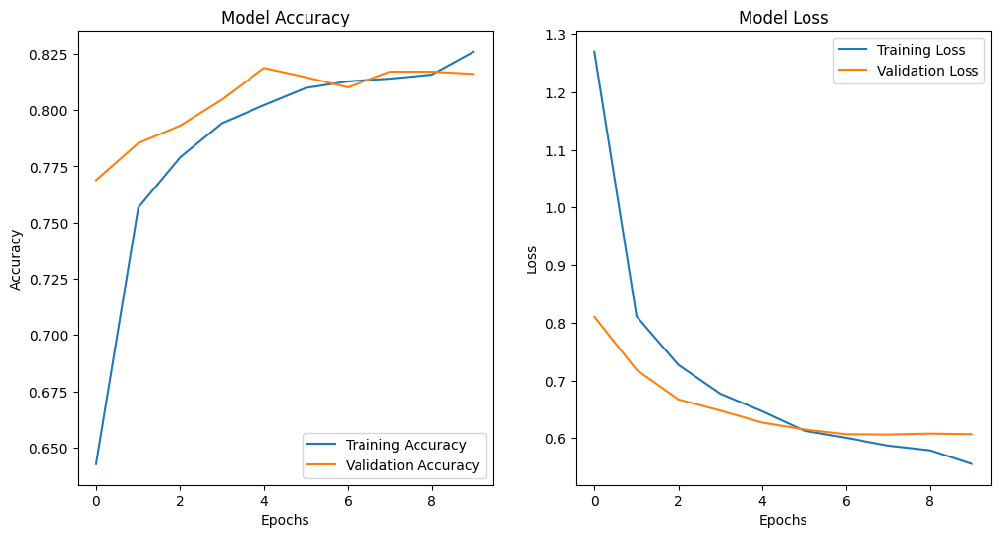

In [ ]:
import os
import json
import matplotlib.pyplot as plt

# Path to save/load training history
history_path = os.path.join(checkpoint_dir, "training_history.json")

print(history_path)

# Load existing training history if it exists
if os.path.exists(history_path):
    print(f"Loading existing training history from: {history_path}")
    with open(history_path, "r") as f:
        history_data = json.load(f)
else:
    print("No existing training history found. Initializing new history.")
    history_data = {"accuracy": [], "val_accuracy": [], "loss": [], "val_loss": []}

# Update history with the current training results if `history` exists
if 'history' in globals() and hasattr(history, 'history'):
    print("Updating training history with new results.")
    for key, values in history.history.items():
        if key in history_data:
            history_data[key].extend(values)
        else:
            history_data[key] = values
else:
    print("No new training history found. Using existing history.")

# Save updated training history to a JSON file
with open(history_path, "w") as f:
    json.dump(history_data, f)

# Plot training history
plt.figure(figsize=(12, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history_data["accuracy"], label="Training Accuracy")
plt.plot(history_data["val_accuracy"], label="Validation Accuracy")
plt.title("Model Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history_data["loss"], label="Training Loss")
plt.plot(history_data["val_loss"], label="Validation Loss")
plt.title("Model Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

# Save the plot
plot_path = os.path.join(checkpoint_dir, "training_history.png")
plt.savefig(plot_path)
plt.show()

#### **Model Performace using the best weights**

In [ ]:
# Path to the weights saved in epoch 10
best_model_weights_path = os.path.join(checkpoint_dir, "model_epoch_10.weights.h5")

# Load the weights into the model
if os.path.exists(best_model_weights_path):
    print(f"Loading weights from: {best_model_weights_path}")
    model.load_weights(best_model_weights_path)
else:
    raise FileNotFoundError(f"Weights file not found at: {best_model_weights_path}")

# Evaluate the model on the validation dataset
val_loss, val_accuracy = model.evaluate(validation_generator)
print(f"Validation Loss: {val_loss}")
print(f"Validation Accuracy: {val_accuracy}")

# Use the model for predictions
# Example: Predict on a batch of images from the validation set
predictions = model.predict(validation_generator)
print(f"Predictions: {predictions}")

Loading weights from: /content/drive/MyDrive/shortcuts/Gr 6 CV3 - CapStone Project/Capstone_Project/EfficientNetB0-checkpoints/model_epoch_10.weights.h5


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


153/153 ━━━━━━━━━━━━━━━━━━━━ 3582s 23s/step - accuracy: 0.7947 - loss: 0.6788
Validation Loss: 0.6096217632293701
Validation Accuracy: 0.8137435913085938
153/153 ━━━━━━━━━━━━━━━━━━━━ 91s 547ms/step
Predictions: [[4.5710128e-02 2.9984266e-03 6.2164436e-03 ... 8.3082145e-01
  2.1735409e-03 1.8250329e-02]
 [1.7405635e-02 1.3081112e-04 7.0863828e-02 ... 3.8991770e-04
  7.2069536e-03 2.1187686e-03]
 [6.3973136e-02 3.7134211e-03 2.1573217e-03 ... 1.3366306e-01
  6.2506380e-03 1.0985862e-01]
 ...
 [6.7677051e-03 5.0796423e-04 5.4097196e-05 ... 2.8181546e-05
  6.5848610e-07 9.8912829e-01]
 [6.0737634e-01 2.1629968e-04 9.1301580e-04 ... 5.9212081e-04
  9.7541713e-05 6.5970235e-02]
 [1.3818774e-02 3.6607740e-05 4.8196849e-05 ... 3.0777765e-06
  3.7474943e-05 6.3863069e-01]]


#### **Classfication report and Confusion Matrix**

In [ ]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score

def model_performance_classification_keras(
    true_labels, predicted_probs, class_labels, threshold=0.5
):
    """
    Function to compute different metrics to check classification model performance for multi-class problems.

    true_labels: Ground truth labels
    predicted_probs: Predicted probabilities from the model
    class_labels: List of class names
    threshold: Threshold for classifying the observation (used for binary classification)
    """
    # Get predicted classes
    predicted_labels = np.argmax(predicted_probs, axis=1)

    # Calculate overall metrics
    acc = accuracy_score(true_labels, predicted_labels)  # Overall Accuracy

    # Calculate metrics for each class
    metrics = []
    for i, class_name in enumerate(class_labels):
        class_true = (true_labels == i).astype(int)
        class_pred = (predicted_labels == i).astype(int)

        recall = recall_score(class_true, class_pred, zero_division=0)
        precision = precision_score(class_true, class_pred, zero_division=0)
        f1 = f1_score(class_true, class_pred, zero_division=0)

        metrics.append(
            {"Class": class_name, "Recall": recall, "Precision": precision, "F1": f1}
        )

    # Create a summary DataFrame
    df_perf = pd.DataFrame(metrics)
    df_perf.loc["Overall"] = {
        "Class": "Overall",
        "Recall": df_perf["Recall"].mean(),
        "Precision": df_perf["Precision"].mean(),
        "F1": df_perf["F1"].mean(),
    }

    return acc, df_perf

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd

# Get true labels from the validation generator
true_labels = validation_generator.classes
class_labels = list(validation_generator.class_indices.keys())  # Class names

# Get predicted labels
predicted_labels = np.argmax(predictions, axis=1)

# Call the function
accuracy_initial, performance_df_initial = model_performance_classification_keras(
    true_labels=true_labels,
    predicted_probs=predictions,
    class_labels=class_labels
)

# Print overall accuracy
print(f"Overall Accuracy: {accuracy_initial:.2f}")

# Print class-wise performance metrics
print("Class-wise Performance Metrics:")
print(performance_df_initial)


Overall Accuracy: 0.81
Class-wise Performance Metrics:
                        Class    Recall  Precision        F1
0                   apple_pie  0.394737   0.545455  0.458015
1              chocolate_cake  0.846667   0.803797  0.824675
2                      donuts  0.806667   0.880000  0.841739
3                     falafel  0.746667   0.785965  0.765812
4                french_fries  0.940000   0.886792  0.912621
5                     hot_dog  0.850000   0.804416  0.826580
6                   ice_cream  0.755853   0.810036  0.782007
7                      nachos  0.813333   0.757764  0.784566
8                 onion_rings  0.896667   0.914966  0.905724
9                    pancakes  0.810000   0.791531  0.800659
10                      pizza  0.870000   0.906250  0.887755
11                    ravioli  0.853333   0.771084  0.810127
12                     samosa  0.843333   0.766667  0.803175
13               spring_rolls  0.773333   0.892308  0.828571
14       strawberry_shortcake 

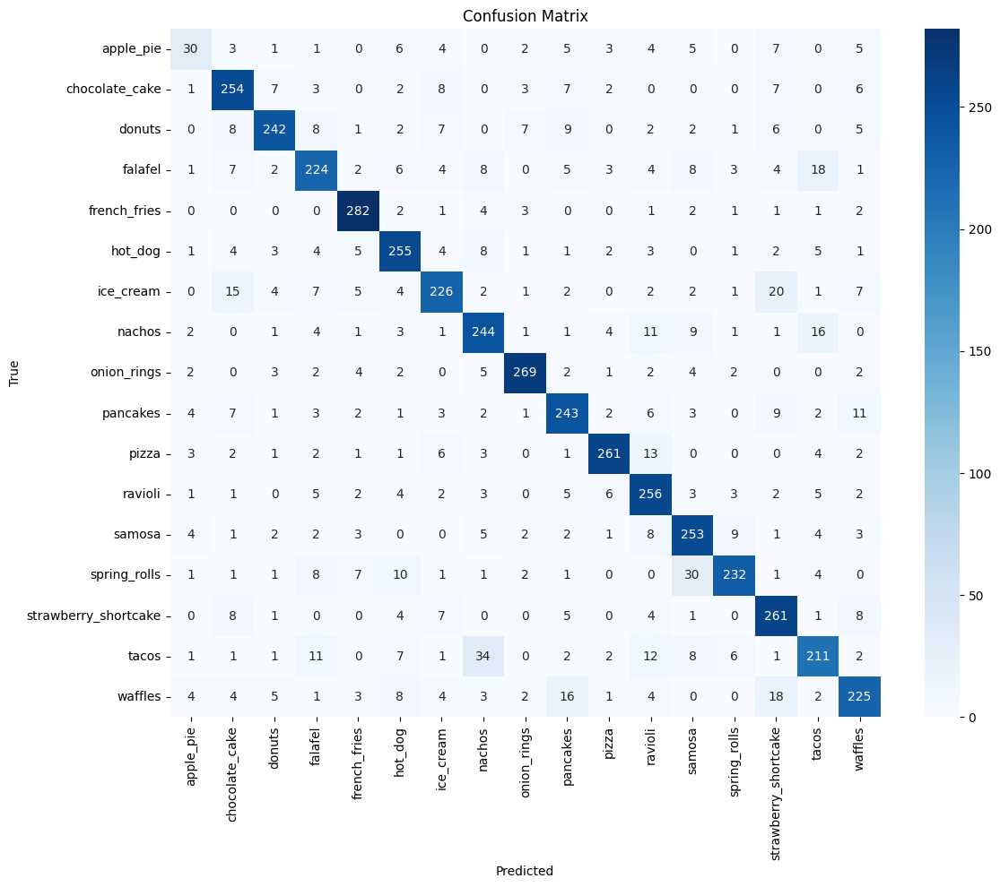

In [ ]:
# Generate confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)
# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

- **onion_ring**s have the best precision and F1 followed by **pizza** and **spring_rolls**

- Since Apple pie have less no. of images i.e. 76 and other class have 300 images. We can observe metrics are lower for this class. To improve the model accuracy further we can assign higher weights to the underrepresented class during training to penalize misclassifications or oversample this class


#### **Model with balanced class weights**

- Running model with class_weight='balanced'

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import os
import re
import numpy as np
from tensorflow.keras.callbacks import ModelCheckpoint

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(true_labels),
    y=true_labels
)
class_weights = dict(enumerate(class_weights))

# Find the last saved weights file
checkpoint_files = [
    f for f in os.listdir(checkpoint_dir) if re.match(r"balanced_model_epoch_\d+\.weights\.h5", f)
]
if checkpoint_files:
    # Extract the epoch numbers from the filenames
    epochs_completed = max(
        int(re.search(r"balanced_model_epoch_(\d+)\.weights\.h5", f).group(1))
        for f in checkpoint_files
    )
    last_checkpoint_path = os.path.join(checkpoint_dir, f"balanced_model_epoch_{epochs_completed:02d}.weights.h5")
    print(f"Resuming training from epoch {epochs_completed}. Loading weights from: {last_checkpoint_path}")
    model.load_weights(last_checkpoint_path)
else:
    print("No checkpoint found. Starting training from scratch.")
    epochs_completed = 0

# Path to save the model weights for fine-tuning
checkpoint_tuning1_path = os.path.join(checkpoint_dir, "balanced_model_epoch_{epoch:02d}.weights.h5")

# Callback to save model weights at every epoch
checkpoint_tuning1_callback = ModelCheckpoint(
    filepath=checkpoint_tuning1_path,
    save_weights_only=True,  # Save only weights
    save_best_only=False,    # Save weights at every epoch
    verbose=1
)

# Resume training with class weights
total_epochs = 7  # Total epochs you want to train
remaining_epochs = total_epochs - epochs_completed
if remaining_epochs > 0:
    print(f"Training with class weights. Remaining epochs: {remaining_epochs}")
    history_fine_tuned = model.fit(
        train_generator,
        validation_data=validation_generator,
        epochs=epochs_completed + remaining_epochs,  # Total epochs to train
        initial_epoch=epochs_completed,  # Start from the last completed epoch
        class_weight=class_weights,  # Apply class weights
        callbacks=[checkpoint_tuning1_callback],
        verbose=1  # Ensure logs are displayed
    )

    print("Training with class weights completed.")

    # Save the updated training history
    history_path = os.path.join(checkpoint_dir, "balanced_model_training_history.json")
    if os.path.exists(history_path):
        # Load previous history if it exists
        with open(history_path, "r") as f:
            previous_history = json.load(f)
        # Merge old and new histories
        for key, values in history_fine_tuned.history.items():
            if key in previous_history:
                previous_history[key].extend(values)
            else:
                previous_history[key] = values
        # Save the merged history
        with open(history_path, "w") as f:
            json.dump(previous_history, f)
    else:
        # Save new history if no previous history exists
        with open(history_path, "w") as f:
            json.dump(history_fine_tuned.history, f)
else:
    print("Training is already complete. No remaining epochs to train.")

Resuming training from epoch 7. Loading weights from: /content/drive/MyDrive/shortcuts/Gr 6 CV3 - CapStone Project/Capstone_Project/EfficientNetB0-checkpoints/balanced_model_epoch_07.weights.h5
Training is already complete. No remaining epochs to train.


In [ ]:
# Evaluate the model on the validation dataset
val_loss, val_accuracy = model.evaluate(validation_generator)
print(f"Validation Loss: {val_loss}")
print(f"Validation Accuracy: {val_accuracy}")

# Use the model for predictions
predictions = model.predict(validation_generator)
print(f"Predictions: {predictions}")

153/153 ━━━━━━━━━━━━━━━━━━━━ 80s 523ms/step - accuracy: 0.8102 - loss: 0.6262
Validation Loss: 0.593762993812561
Validation Accuracy: 0.8215384483337402
153/153 ━━━━━━━━━━━━━━━━━━━━ 78s 512ms/step
Predictions: [[1.23528643e-02 1.11263373e-03 1.59139128e-03 ... 9.13708031e-01
  2.94791767e-03 2.37477571e-02]
 [1.62648968e-02 6.79191944e-05 1.09474048e-01 ... 2.66785035e-04
  1.33584235e-02 2.47801002e-02]
 [3.66380155e-01 9.42197815e-03 1.76354218e-03 ... 5.07833660e-02
  2.12620548e-03 5.63247204e-02]
 ...
 [3.97009179e-02 4.64956183e-03 1.26892948e-04 ... 3.59809892e-05
  9.03877265e-07 9.52648461e-01]
 [7.04194307e-01 5.93279474e-05 8.15417524e-03 ... 2.69737153e-04
  2.81476132e-05 1.38558194e-01]
 [4.10646439e-01 3.55186639e-04 4.33757996e-05 ... 5.22846631e-06
  3.43866714e-06 5.32206178e-01]]


In [ ]:
# Get predicted labels
predicted_labels = np.argmax(predictions, axis=1)

# Call the function
accuracy_balanced_model, performance_df_balanced_model = model_performance_classification_keras(
    true_labels=true_labels,
    predicted_probs=predictions,
    class_labels=class_labels
)

# Print overall accuracy
print(f"Overall Accuracy: {accuracy_balanced_model:.2f}")

# Print class-wise performance metrics
print("Class-wise Performance Metrics:")
print(performance_df_balanced_model)

Overall Accuracy: 0.82
Class-wise Performance Metrics:
                        Class    Recall  Precision        F1
0                   apple_pie  0.657895   0.373134  0.476190
1              chocolate_cake  0.810000   0.855634  0.832192
2                      donuts  0.800000   0.845070  0.821918
3                     falafel  0.780000   0.787879  0.783920
4                french_fries  0.923333   0.926421  0.924875
5                     hot_dog  0.856667   0.871186  0.863866
6                   ice_cream  0.826087   0.817881  0.821963
7                      nachos  0.843333   0.671088  0.747415
8                 onion_rings  0.883333   0.943060  0.912220
9                    pancakes  0.760000   0.797203  0.778157
10                      pizza  0.893333   0.899329  0.896321
11                    ravioli  0.806667   0.867384  0.835924
12                     samosa  0.803333   0.803333  0.803333
13               spring_rolls  0.833333   0.850340  0.841751
14       strawberry_shortcake 

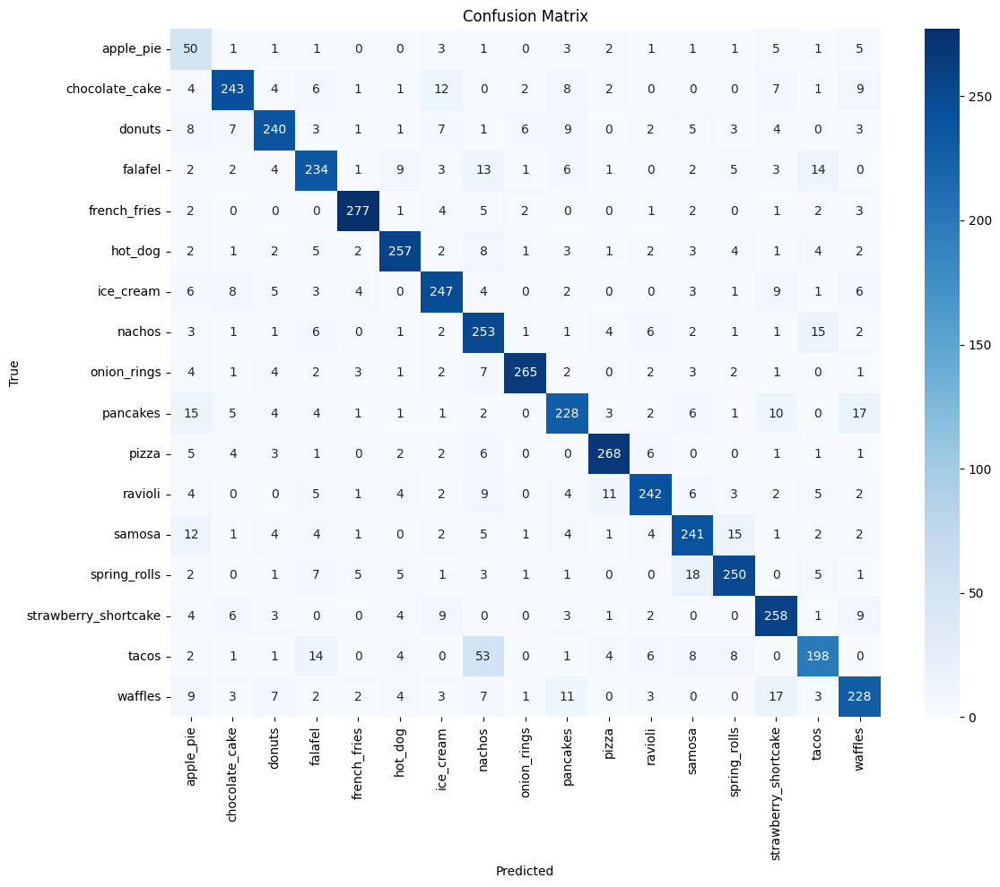

In [ ]:
# Generate confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)
# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

#### **Observations**

- Applying balanced class weights improved the performance of the underrepresented class ("**apple_pie**") in certain metrics, particularly recall. However, this came at the cost of a slight decrease in precision. Overall, precision, recall, and F1 scores have shown improvement, but there is still room for enhancement through techniques like oversampling and other advanced strategies.

- 53 'tacos' images got classified as 'nachos', similarly 17 'waffles' got classified as 'strawberry_shortcake', we have other similar examples of wrong classfications.

- The model now achieves a validation accuracy of **82% (0.82)**, indicating consistent performance across the dataset.

- The "**onion_rings**" class continues to lead in terms of precision (94%), recall (88%), and F1 (91%) score. The second-best performance across these metrics is now observed in the **"french_fries"** class, followed by **"pizza."**

## **Insights and Recommendations**

- Further fine-tune the model with a specific focus on addressing the class imbalance issue related to the "apple_pie" category. Consider techniques such as oversampling the minority class and/or applying targeted data augmentation strategies specifically for this class to improve representation and performance.
- The model currently achieves a **validation accuracy of 82%, with an average recall of 80.92%, precision of 80.46%, and an F1 score of 80.34%**. These metrics indicate a solid starting point and suggest that the model is reasonably reliable for classifying food item images.
- Some images in the dataset appear to be invalid, as they do not visually correspond to their assigned class. During manual annotation, we observed an image labeled as "**pancakes**" that actually resembled a **burger**. These outliers negatively impacted model performance. A suitable strategy should be implemented to address such cases—one approach could be to identify and remove these mislabeled images from the dataset.
- Misclassifications such as "tacos" being predicted as "nachos" and "waffles" as "strawberry_shortcake" indicate areas where the model may be struggling to distinguish between visually similar classes. These cases should be analyzed further, and appropriate steps should be taken to improve class separation and enhance classification accuracy.

# **Milestone 2**

 # Fine tune the trained basic CNN models to classify the food

## Model Building Oversample Minority Classes

#### Create new model with existing weights.

In [ ]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.utils import resample

import json
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from IPython.display import clear_output
%matplotlib inline
from sklearn.metrics import classification_report, confusion_matrix



In [ ]:
#Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

#Logic to accesss shared folder in Google Drive using shortcuts

#Set Project base path
project_path = '/content/drive/MyDrive/shortcuts/Gr 6 CV3 - CapStone Project/Capstone_Project/'
#project_path = '/content/drive/MyDrive/shortcuts/Capstone/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Define the path to the zip file and the extraction directory
zip_file_path = project_path + 'Food_101.zip'
food_dir = project_path + 'Food_101'

# Extract the zip file if the directory doesn't exist
if not os.path.exists(food_dir):
    print(f"Extracting '{zip_file_path}' to '{food_dir}'...")
    #with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    #    zip_ref.extractall(project_path)
    print("Extraction complete.")
else:
    print(f"Directory '{food_dir}' already exists. Skipping extraction.")

Directory '/content/drive/MyDrive/shortcuts/Gr 6 CV3 - CapStone Project/Capstone_Project/Food_101' already exists. Skipping extraction.


In [ ]:
# Parameters
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32
NUM_CLASSES = 17
DATA_DIR = food_dir  # Dataset folder with subfolders per class

In [ ]:
# Directory to save the new model weights
oversampled_checkpoint_dir = os.path.join(project_path, "EfficientNetB0-new-checkpoints")
checkpoint_dir = os.path.join(project_path, "EfficientNetB0-checkpoints")
os.makedirs(oversampled_checkpoint_dir, exist_ok=True)

# Path to save the new model weights
oversampled_checkpoint_path = os.path.join(oversampled_checkpoint_dir, "oversampled_balanced_weights_model_epoch_{epoch:02d}.weights.h5")

In [ ]:
import os
import shutil
from sklearn.utils import resample

def oversample_data(data_dir, target_classes, target_count):
    """
    Oversample the underrepresented classes to match the target count.

    Args:
        data_dir (str): Path to the dataset directory.
        target_classes (list): List of underrepresented class names.
        target_count (int): Target number of images for each class.

    Returns:
        None
    """
    for class_name in target_classes:
        class_dir = os.path.join(data_dir, class_name)
        if not os.path.exists(class_dir):
            print(f"Class directory {class_dir} not found.")
            continue

        # Get all image paths in the class directory
        image_paths = [os.path.join(class_dir, img) for img in os.listdir(class_dir) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
        current_count = len(image_paths)

        if current_count < target_count:
            # Oversample by duplicating images
            oversampled_images = resample(image_paths, replace=True, n_samples=target_count - current_count, random_state=42)
            for i, img_path in enumerate(oversampled_images):
                # Copy the image with a new name
                new_img_name = f"oversampled_{i}_{os.path.basename(img_path)}"
                new_img_path = os.path.join(class_dir, new_img_name)
                shutil.copy(img_path, new_img_path)  # Use shutil.copy to copy the file
            print(f"Oversampled {class_name} to {target_count} images.")
        else:
            print(f"{class_name} already has {current_count} images. No oversampling needed.")

In [ ]:
# Oversample the underrepresented classes
oversample_data(DATA_DIR, target_classes=["apple_pie", "ice_cream"], target_count=1000)

Oversampled apple_pie to 1000 images.
Oversampled ice_cream to 1000 images.


In [ ]:
# Data augmentation and preprocessing
new_train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    horizontal_flip=True,
    validation_split=0.3
)

# Create a new training data generator
new_train_generator = new_train_datagen.flow_from_directory(
    DATA_DIR,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

# Create a new validation data generator
new_validation_generator = new_train_datagen.flow_from_directory(
    DATA_DIR,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

Found 11900 images belonging to 17 classes.
Found 5100 images belonging to 17 classes.


In [ ]:
# Load EfficientNetB0 base model without top layer
new_base_model = EfficientNetB0(include_top=False, input_shape=IMAGE_SIZE + (3,), weights='imagenet')
new_base_model.trainable = False

# Build the new classification head
inputs = layers.Input(shape=IMAGE_SIZE + (3,))
x = new_base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)
oversampled_balanced_weights_model = models.Model(inputs, outputs)

# Compile the new model
oversampled_balanced_weights_model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Load weights from the previous model
previous_weights_path = os.path.join(checkpoint_dir, "balanced_model_epoch_07.weights.h5")
if os.path.exists(previous_weights_path):
    print(f"Loading weights from: {previous_weights_path}")
    oversampled_balanced_weights_model.load_weights(previous_weights_path)
    print('Weights Loaded!')
else:
    raise FileNotFoundError(f"Weights file not found at: {previous_weights_path}")

# Callback to save new model weights at every epoch
oversampled_checkpoint_callback = ModelCheckpoint(
    filepath=oversampled_checkpoint_path,
    save_weights_only=True,
    save_best_only=False,
    verbose=1
)

Loading weights from: /content/drive/MyDrive/shortcuts/Gr 6 CV3 - CapStone Project/Capstone_Project/EfficientNetB0-checkpoints/balanced_model_epoch_07.weights.h5
Weights Loaded!


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


#### Train model with Oversampled minority classes

In [ ]:
# Train the new model
total_epochs = 10
oversampled_balanced_weights_model_history = oversampled_balanced_weights_model.fit(
    new_train_generator,
    validation_data=new_validation_generator,
    epochs=total_epochs,
    callbacks=[oversampled_checkpoint_callback],
    verbose=1
)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.8220 - loss: 0.5640
Epoch 1: saving model to /content/drive/MyDrive/shortcuts/Gr 6 CV3 - CapStone Project/Capstone_Project/EfficientNetB0-new-checkpoints/oversampled_balanced_weights_model_epoch_01.weights.h5
372/372 ━━━━━━━━━━━━━━━━━━━━ 4145s 11s/step - accuracy: 0.8220 - loss: 0.5640 - val_accuracy: 0.8245 - val_loss: 0.5834
Epoch 2/10
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 515ms/step - accuracy: 0.8220 - loss: 0.5475
Epoch 2: saving model to /content/drive/MyDrive/shortcuts/Gr 6 CV3 - CapStone Project/Capstone_Project/EfficientNetB0-new-checkpoints/oversampled_balanced_weights_model_epoch_02.weights.h5
372/372 ━━━━━━━━━━━━━━━━━━━━ 273s 735ms/step - accuracy: 0.8220 - loss: 0.5475 - val_accuracy: 0.8237 - val_loss: 0.5810
Epoch 3/10
372/372 ━━━━━━━━━━━━━━━━━━━━ 0s 517ms/step - accuracy: 0.8389 - loss: 0.5165
Epoch 3: saving model to /content/drive/MyDrive/shortcuts/Gr 6 CV3 - CapStone Project/Capstone_Project/EfficientNetB0-ne

In [ ]:
# Save the new training history
oversampled_history_path = os.path.join(oversampled_checkpoint_dir, "oversampled_balanced_weights_training_history.json")
with open(oversampled_history_path, "w") as f:
    json.dump(oversampled_balanced_weights_model_history.history, f)

print(f"New training history saved to: {oversampled_history_path}")

New training history saved to: /content/drive/MyDrive/shortcuts/Gr 6 CV3 - CapStone Project/Capstone_Project/EfficientNetB0-new-checkpoints/oversampled_balanced_weights_training_history.json


#### Evaluate Model

In [ ]:
# Get true labels from the validation generator
true_labels = new_validation_generator.classes
class_labels = list(new_validation_generator.class_indices.keys())  # Class names

In [ ]:
# Evaluate the model on the validation dataset
val_loss, val_accuracy = oversampled_balanced_weights_model.evaluate(new_validation_generator)
print(f"Validation Loss: {val_loss}")
print(f"Validation Accuracy: {val_accuracy}")

# Use the oversampled_balanced_weights_model for predictions
predictions = oversampled_balanced_weights_model.predict(new_validation_generator)
print(f"Predictions: {predictions}")

160/160 ━━━━━━━━━━━━━━━━━━━━ 83s 520ms/step - accuracy: 0.8367 - loss: 0.5370
Validation Loss: 0.5706741809844971
Validation Accuracy: 0.8264706134796143
160/160 ━━━━━━━━━━━━━━━━━━━━ 92s 533ms/step
Predictions: [[4.76259321e-01 6.97963638e-04 1.73797947e-03 ... 4.70280886e-01
  1.58416363e-03 5.48161194e-03]
 [5.51208377e-01 8.16329612e-06 6.30339310e-02 ... 2.00479426e-05
  1.91765328e-04 1.75134069e-03]
 [7.05581248e-01 1.46976404e-03 6.10832009e-04 ... 2.38315258e-02
  4.25823359e-03 4.15265560e-02]
 ...
 [2.79928632e-02 8.85467278e-04 7.39451498e-05 ... 4.07327889e-06
  1.05954506e-07 9.70229268e-01]
 [9.57819819e-01 1.42157169e-05 1.49355648e-04 ... 3.06297588e-05
  1.19527067e-05 1.23791378e-02]
 [1.09339900e-01 1.49730877e-05 2.38824250e-05 ... 5.23641029e-06
  2.67329706e-05 3.07284534e-01]]


In [ ]:
# Get predicted labels
predicted_labels = np.argmax(predictions, axis=1)

# Call the function
accuracy_oversampled_balanced_weights_model, performance_df_oversampled_balanced_weights_model = model_performance_classification_keras(
    true_labels=true_labels,
    predicted_probs=predictions,
    class_labels=class_labels
)

In [ ]:
# Print overall accuracy
print(f"Overall Accuracy: {accuracy_oversampled_balanced_weights_model:.2f}")

# Print class-wise performance metrics
print("Class-wise Performance Metrics:")
print(performance_df_oversampled_balanced_weights_model)

Overall Accuracy: 0.82
Class-wise Performance Metrics:
                        Class    Recall  Precision        F1
0                   apple_pie  0.900000   0.727763  0.804769
1              chocolate_cake  0.863333   0.809375  0.835484
2                      donuts  0.830000   0.819079  0.824503
3                     falafel  0.756667   0.793706  0.774744
4                french_fries  0.893333   0.950355  0.920962
5                     hot_dog  0.846667   0.838284  0.842454
6                   ice_cream  0.790000   0.834507  0.811644
7                      nachos  0.770000   0.764901  0.767442
8                 onion_rings  0.903333   0.924915  0.913997
9                    pancakes  0.740000   0.819188  0.777583
10                      pizza  0.893333   0.920962  0.906937
11                    ravioli  0.850000   0.777439  0.812102
12                     samosa  0.786667   0.890566  0.835398
13               spring_rolls  0.856667   0.831715  0.844007
14       strawberry_shortcake 

#### Confusion Matrix

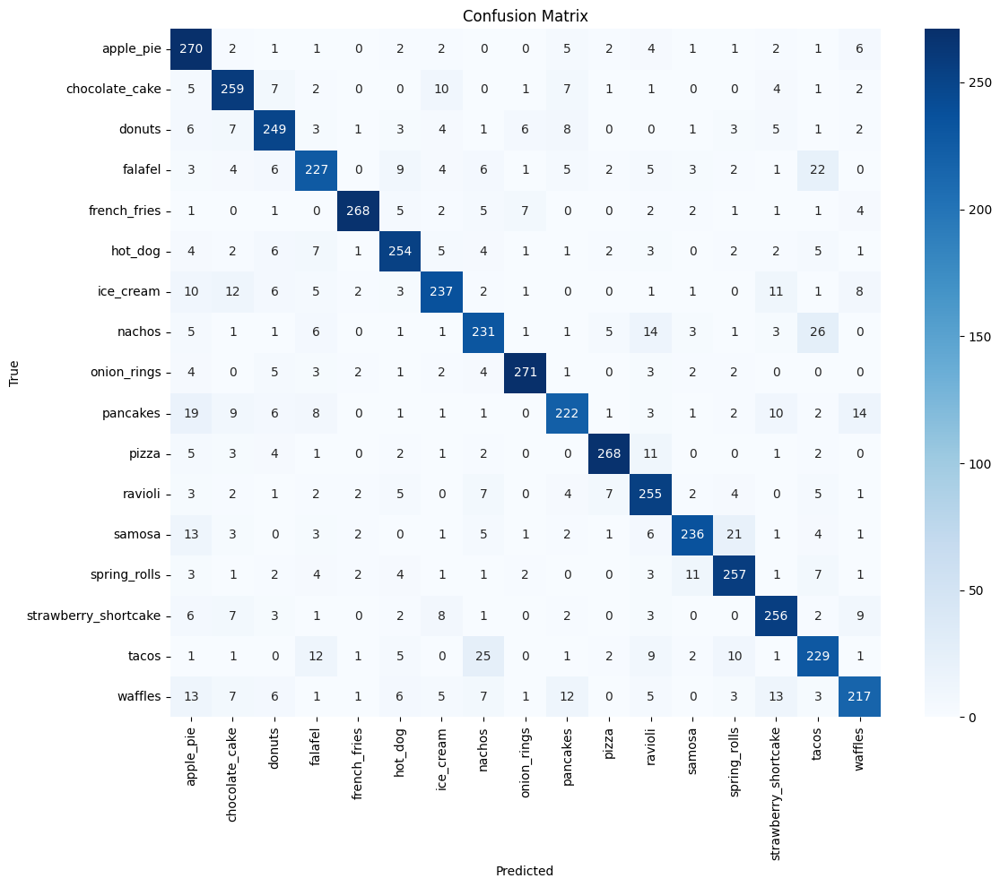

In [ ]:
# Generate confusion matrix
oversampled_balanced_weights_model_conf_matrix = confusion_matrix(true_labels, predicted_labels)
# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(oversampled_balanced_weights_model_conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels,
            yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

#### Observations

- The model's performance for classes with fewer images has significantly improved.
- For the apple_pie class, performance improved notably:
  - Recall increased from 0.6579 to 0.9000
  - Precision increased from 0.3731 to 0.7278
  - F1 Score improved from 0.4762
- For the ice_cream class, Precision improved slightly, while Recall and F1 Score decreased marginally:
  - Recall: 0.8261 → 0.7900
  - Precision: 0.8179 → 0.8220
  - F1 Score: 0.8116 → slight decrease
  This is expected, as the ice_cream class originally had 993 images and was oversampled to 1000—only 7 new images were added.
- The confusion matrix clearly shows the improvement.
- Overall, the model's validation performance has improved slightly:
  - Validation Accuracy remains at 82%
  - Average Recall: 80.92% → 82.47%
  - Average Precision: 80.46% → 82.76%
  - F1 Score: 80.34% → 82.48%
  
  These metrics indicate that the previous model's weakness in identifying underrepresented classes has been effectively addressed.

## Food Detection Model Creation

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#### Import Required Libraries
  - **Rationale**: Google Colab at the time of this model building supports TensorFlow version 2.8 and above and doesn't support below versions. I'm using the Detectron library to create RCNN models and their variants. This library is compatible with TensorFlow 2.8+, unlike the Matterport GitHub library for Mask R-CNN (and its forks), which do not support TensorFlow 2.8 and later.

- Install Detectron Library

In [ ]:
import os
import numpy as np
import json
import cv2
import random

In [ ]:
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-_kzwy9mp
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-_kzwy9mp
  Resolved https://github.com/facebookresearch/detectron2.git to commit 65184fc057d4fab080a98564f6b60fae0b94edc4
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.3/81.3 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 37.8 MB/s eta 0:00:00
  Created wheel for detectron2: filename=detectron2-0.6-cp311-cp311-linux_x86_64.whl size=6438669 sha256=18f9785afaa7b72b517fea7a32a31d6a4aae4c8a8a78c0b8abf0112cae398ffc
  Stored in directory: /tmp/pip-ephem-wheel-cache-4gykv41o/wheels/17/d9/40/60db98e485aa9455d

## Faster RCNN Model

In [ ]:
#Food Detection model using Mask RCNN
import os
import detectron2
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.utils.visualizer import Visualizer
from detectron2 import model_zoo
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.engine import DefaultPredictor
from detectron2.data import build_detection_test_loader
import cv2
import matplotlib.pyplot as plt
import random
import pickle


In [ ]:
# Paths to the dataset
#captsone_project_path = "/content/drive/MyDrive/shortcuts/Gr 6 CV3 - CapStone Project/"
captsone_project_path = "/content/drive/MyDrive/shortcuts/Gr 6 CV3 - CapStone Project/Capstone_Project/"
#captsone_project_path = "/content/drive/MyDrive/shortcuts/Capstone/"
train_images_path = captsone_project_path + "fooddetection-cap-cv3-may24b.v7i.coco/train"
val_images_path = captsone_project_path + "fooddetection-cap-cv3-may24b.v7i.coco/test"
train_annotations_path = train_images_path + "/_annotations.coco.json"
val_annotations_path = val_images_path + "/_annotations.coco.json"


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



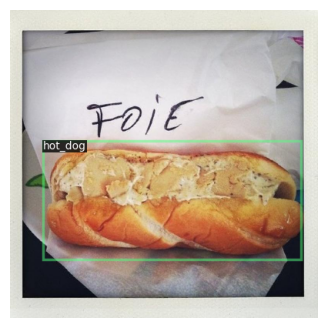

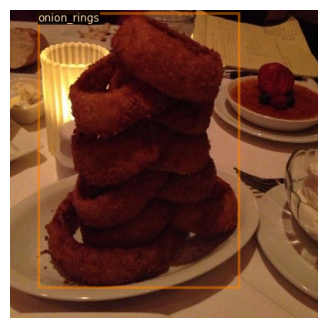

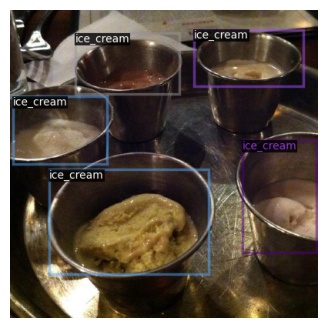

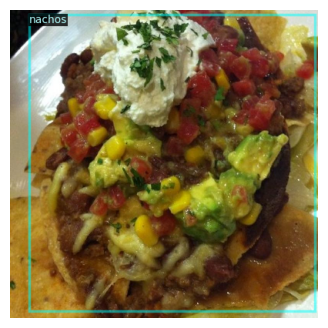

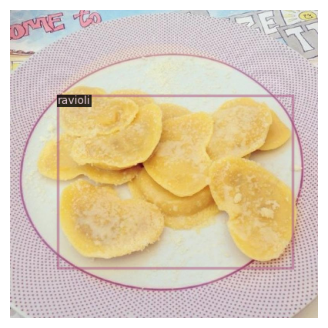

In [ ]:
# Register the dataset in Detectron2
register_coco_instances("food_train", {}, train_annotations_path, train_images_path)
register_coco_instances("food_val", {}, val_annotations_path, val_images_path)

# Load metadata
food_metadata = MetadataCatalog.get("food_train")

# Visualize a few samples from the dataset
def visualize_samples(dataset_name, metadata, num_samples=5):
    dataset_dicts = DatasetCatalog.get(dataset_name)
    random.shuffle(dataset_dicts)  # Shuffle the dataset to show random images
    for d in dataset_dicts[:num_samples]:
        img = cv2.cvtColor(cv2.imread(d["file_name"]), cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
        visualizer = Visualizer(img, metadata=metadata, scale=0.5)
        vis = visualizer.draw_dataset_dict(d)

        plt.figure(figsize=(4, 4))
        plt.axis("off")
        plt.imshow(vis.get_image())
        plt.show()


visualize_samples("food_train", food_metadata)

In [ ]:
# Configure the Mask R-CNN model for object detection
cfg_fast_rcnn = get_cfg()
# Get Faster RCNN Config from detectron's model_zoo
cfg_fast_rcnn.merge_from_file(
    detectron2.model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
)  # Use Faster R-CNN backbone for object detection
cfg_fast_rcnn.DATASETS.TRAIN = ("food_train",)
cfg_fast_rcnn.DATASETS.TEST = ("food_val",)
cfg_fast_rcnn.DATALOADER.NUM_WORKERS = 4
cfg_fast_rcnn.MODEL.WEIGHTS = detectron2.model_zoo.get_checkpoint_url(
    "COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"
)  # Pretrained weights
cfg_fast_rcnn.SOLVER.IMS_PER_BATCH = 2
cfg_fast_rcnn.SOLVER.BASE_LR = 0.00025  # Learning rate
cfg_fast_rcnn.SOLVER.MAX_ITER = 3000  # Adjust based on dataset size
cfg_fast_rcnn.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg_fast_rcnn.MODEL.ROI_HEADS.NUM_CLASSES = len(food_metadata.thing_classes)  # Number of classes
cfg_fast_rcnn.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Threshold for predictions
# Disable mask prediction (only bounding box detection)
cfg_fast_rcnn.MODEL.MASK_ON = False


**Augmentation** - Detectron performs some augmentations by default
- ResizeShortestEdge resizes images so the shortest side is within a range, e.g., 800 pixels)

- RandomFlip (horizontal flip with 50% probability)
- Rootation and shear cannot be applied due to bouding box

# **Training the Model**

In [ ]:
# Output directory
cfg_fast_rcnn.OUTPUT_DIR = captsone_project_path + "output_food_detection_faster_rcnn"
os.makedirs(cfg_fast_rcnn.OUTPUT_DIR, exist_ok=True)

# Train the model
trainer = DefaultTrainer(cfg_fast_rcnn)
trainer.resume_or_load(resume=False)
trainer.train()

[06/11 20:33:26 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
model_final_280758.pkl: 167MB [00:01, 105MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[06/11 20:33:28 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.11/dist-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[06/11 20:33:38 d2.utils.events]:  eta: 0:14:01  iter: 19  total_loss: 3.025  loss_cls: 2.494  loss_box_reg: 0.4933  loss_rpn_cls: 0.004579  loss_rpn_loc: 0.006831    time: 0.2872  last_time: 0.3118  data_time: 0.0391  last_data_time: 0.0052   lr: 4.9953e-06  max_mem: 1740M
[06/11 20:33:48 d2.utils.events]:  eta: 0:13:48  iter: 39  total_loss: 2.85  loss_cls: 2.353  loss_box_reg: 0.459  loss_rpn_cls: 0.007624  loss_rpn_loc: 0.006427    time: 0.2869  last_time: 0.2190  data_time: 0.0078  last_data_time: 0.0041   lr: 9.9902e-06  max_mem: 1740M
[06/11 20:33:54 d2.utils.events]:  eta: 0:13:48  iter: 59  total_loss: 2.481  loss_cls: 2.041  loss_box_reg: 0.4611  loss_rpn_cls: 0.01153  loss_rpn_loc: 0.005852    time: 0.2861  last_time: 0.2710  data_time: 0.0076  last_data_time: 0.0053   lr: 1.4985e-05  max_mem: 1740M
[06/11 20:34:00 d2.utils.events]:  eta: 0:13:51  iter: 79  total_loss: 2.069  loss_cls: 1.547  loss_box_reg: 0.4625  loss_rpn_cls: 0.003853  loss_rpn_loc: 0.007155    time: 0.292

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


# **Model Evaluation**

In [ ]:
# Evaluate the model
cfg_fast_rcnn.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Reduce threshold
test_loader = build_detection_test_loader(cfg_fast_rcnn, "food_val")
evaluator = COCOEvaluator("food_val", cfg_fast_rcnn, False, output_dir=cfg_fast_rcnn.OUTPUT_DIR)
trainer.test(cfg_fast_rcnn, trainer.model, evaluators=[evaluator])


predictor = DefaultPredictor(cfg_fast_rcnn)

WARNING [06/11 20:52:20 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/11 20:52:20 d2.data.datasets.coco]: Loaded 180 images in COCO format from /content/drive/MyDrive/shortcuts/Capstone/fooddetection-cap-cv3-may24b.v7i.coco/test/_annotations.coco.json
[06/11 20:52:20 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[06/11 20:52:20 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[06/11 20:52:20 d2.data.common]: Serializing 180 elements to byte tensors and concatenating them all ...
[06/11 20:52:20 d2.data.common]: Serialized dataset takes 0.06 MiB
WARNING [06/11 20:52:20 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [06/11 20:52:20 d2.data.datas

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[06/11 20:52:23 d2.evaluation.evaluator]: Inference done 11/180. Dataloading: 0.0022 s/iter. Inference: 0.0901 s/iter. Eval: 0.0003 s/iter. Total: 0.0926 s/iter. ETA=0:00:15
[06/11 20:52:28 d2.evaluation.evaluator]: Inference done 70/180. Dataloading: 0.0017 s/iter. Inference: 0.0841 s/iter. Eval: 0.0003 s/iter. Total: 0.0861 s/iter. ETA=0:00:09
[06/11 20:52:33 d2.evaluation.evaluator]: Inference done 128/180. Dataloading: 0.0017 s/iter. Inference: 0.0842 s/iter. Eval: 0.0003 s/iter. Total: 0.0863 s/iter. ETA=0:00:04
[06/11 20:52:38 d2.evaluation.evaluator]: Total inference time: 0:00:15.651795 (0.089439 s / iter per device, on 1 devices)
[06/11 20:52:38 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:14 (0.085554 s / iter per device, on 1 devices)
[06/11 20:52:38 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[06/11 20:52:38 d2.evaluation.coco_evaluation]: Saving results to /content/drive/MyDrive/shortcuts/Capstone/output_food_detection_faster_

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


### **Model Metrics**

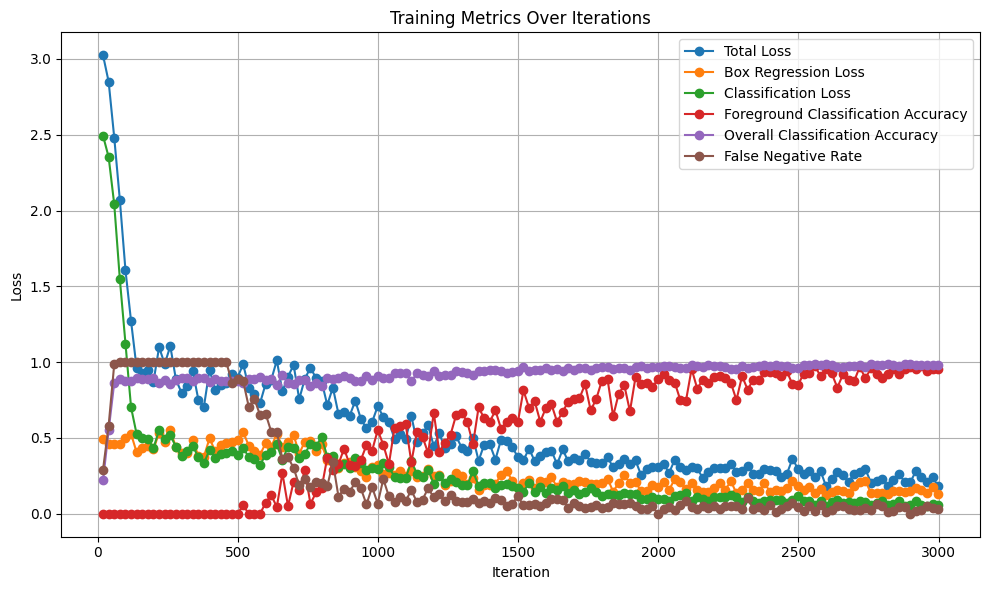

In [ ]:
import json
import matplotlib.pyplot as plt

# Path to evaluation results
metrics_path_faster_rcnn = captsone_project_path + "output_food_detection_faster_rcnn/metrics.json"

# Load metrics from the NDJSON evaluation results
def load_metrics_ndjson(metrics_path):
    metrics = []
    with open(metrics_path, "r") as f:
        for line in f:
            metrics.append(json.loads(line))  # Parse each line as a JSON object
    return metrics


# Plot metrics
def plot_metrics_ndjson(metrics):
    # Extract iterations and losses
    iterations = [m['iteration'] for m in metrics]
    total_loss = [m['total_loss'] for m in metrics]
    loss_box_reg = [m['loss_box_reg'] for m in metrics]
    loss_cls = [m['loss_cls'] for m in metrics]
    fg_cls_accuracy = [m['fast_rcnn/fg_cls_accuracy'] for m in metrics]
    cls_accuracy = [m['fast_rcnn/cls_accuracy'] for m in metrics]
    false_negative = [m['fast_rcnn/false_negative'] for m in metrics]


    # Plot total loss over iterations
    plt.figure(figsize=(10, 6))
    plt.plot(iterations, total_loss, label="Total Loss", marker="o")
    plt.plot(iterations, loss_box_reg, label="Box Regression Loss", marker="o")
    plt.plot(iterations, loss_cls, label="Classification Loss", marker="o")
    plt.plot(iterations, fg_cls_accuracy, label="Foreground Classification Accuracy", marker="o")
    plt.plot(iterations, cls_accuracy, label="Overall Classification Accuracy", marker="o")
    plt.plot(iterations, false_negative, label="False Negative Rate", marker="o")
    plt.xlabel("Iteration")
    plt.ylabel("Loss")
    plt.title("Training Metrics Over Iterations")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Load and showcase metrics
metrics_ndjson = load_metrics_ndjson(metrics_path_faster_rcnn)
plot_metrics_ndjson(metrics_ndjson)

#### **Observations**
 - Overall Classification remained stable throught the iterations
 - Overall loss decreased throughout the iterations
 - As we increment the iterations the Classification Accuracy has improved

In [ ]:
# Run inference and evaluation
results = inference_on_dataset(trainer.model, test_loader, evaluator)

[06/11 20:53:33 d2.evaluation.evaluator]: Start inference on 180 batches


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[06/11 20:53:34 d2.evaluation.evaluator]: Inference done 11/180. Dataloading: 0.0013 s/iter. Inference: 0.0825 s/iter. Eval: 0.0002 s/iter. Total: 0.0841 s/iter. ETA=0:00:14
[06/11 20:53:39 d2.evaluation.evaluator]: Inference done 66/180. Dataloading: 0.0027 s/iter. Inference: 0.0876 s/iter. Eval: 0.0003 s/iter. Total: 0.0907 s/iter. ETA=0:00:10
[06/11 20:53:44 d2.evaluation.evaluator]: Inference done 124/180. Dataloading: 0.0021 s/iter. Inference: 0.0860 s/iter. Eval: 0.0003 s/iter. Total: 0.0885 s/iter. ETA=0:00:04
[06/11 20:53:49 d2.evaluation.evaluator]: Total inference time: 0:00:15.493481 (0.088534 s / iter per device, on 1 devices)
[06/11 20:53:49 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:15 (0.085790 s / iter per device, on 1 devices)
[06/11 20:53:49 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[06/11 20:53:49 d2.evaluation.coco_evaluation]: Saving results to /content/drive/MyDrive/shortcuts/Capstone/output_food_detection_faster_

# **Model Validation Performance**

In [ ]:
print("Evaluation Results:")
for key, value in results.items():
    if isinstance(value, dict):  # Handle nested dictionaries
        print(f"{key}:")
        for sub_key, sub_value in value.items():
            print(f"  {sub_key}: {sub_value:.4f}" if isinstance(sub_value, (int, float)) else f"  {sub_key}: {sub_value}")
    else:
        print(f"{key}: {value:.4f}" if isinstance(value, (int, float)) else f"{key}: {value}")


Evaluation Results:
bbox:
  AP: 38.0543
  AP50: 54.1414
  AP75: 44.5139
  APs: nan
  APm: nan
  APl: 38.0543
  AP-food-detection: nan
  AP-apple_pie: 8.0968
  AP-chocolate_cake: 45.4741
  AP-french_fries: 46.5665
  AP-hot_dog: 38.3747
  AP-ice_cream: 28.4363
  AP-nachos: 53.2992
  AP-onion_rings: 55.5949
  AP-pancakes: 42.6633
  AP-pizza: 73.3566
  AP-ravioli: 28.2030
  AP-samosa: 15.5312
  AP-spring_rolls: 21.0552


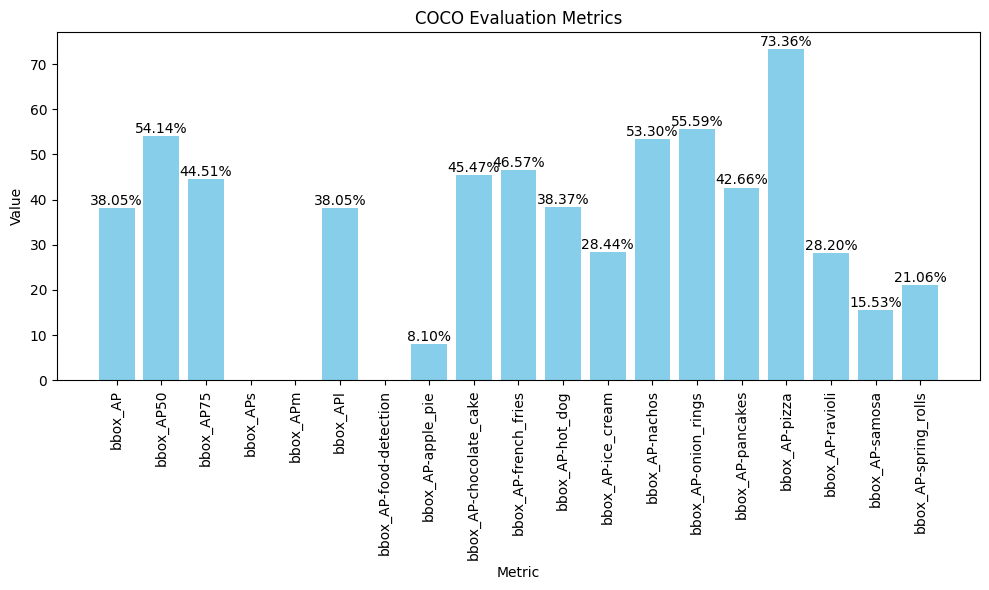

In [ ]:
flattened_results = {}
for key, value in results.items():
    if isinstance(value, dict):  # Handle nested dictionaries
        for sub_key, sub_value in value.items():
            flattened_results[f"{key}_{sub_key}"] = sub_value
    else:
        flattened_results[key] = value

# Extract keys and values for plotting
keys = list(flattened_results.keys())
values = [flattened_results[key] for key in keys]

# Create a bar chart
plt.figure(figsize=(10, 6))
bars = plt.bar(keys, values, color="skyblue")

# Add percentage labels on top of the bars
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,  # X-coordinate
        height + 0.01,  # Y-coordinate (slightly above the bar)
        f"{height :.2f}%",  # Format as percentage
        ha="center",  # Horizontal alignment
        va="bottom",  # Vertical alignment
        fontsize=10,  # Font size
        color="black"  # Text color
    )
plt.title("COCO Evaluation Metrics")
plt.xlabel("Metric")
plt.ylabel("Value")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

#### **Observation**
 - Overall Bounding Box Average Precision is 38.05%%
 - Bounding Box Average Precision is highest for pizza 73.36%, followed by onion_rings 55.59%, nachos 53.30%, french_fries 46.47% and choclate cake 45.47%
 - Classes like apple pie with Average Precision 8.10%, samosa 15.53%, spring_rolls 21.06% were lowest performing.

In [ ]:
# Load Predicted annotated file generated by above predictor
results_path = captsone_project_path + "output_food_detection_faster_rcnn/coco_instances_results.json"

# Load the predictions from the JSON file
with open(results_path, "r") as f:
    predictions = json.load(f)

# **Visualising the Model Predictions**

In [ ]:
# Create a tabular visualization using the predictions
def visualize_output_in_table(random_images, predictions, metadata):
    num_images = len(random_images)
    fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))

    for i, d in enumerate(random_images):
        # Load the image
        image_path = d["file_name"]
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Original Image
        axes[i, 0].imshow(image_rgb)
        axes[i, 0].set_title("Original Image")
        axes[i, 0].axis("off")

        # Ground Truth Image
        visualizer_gt = Visualizer(image_rgb, metadata=metadata, scale=0.5)
        vis_gt = visualizer_gt.draw_dataset_dict(d)
        axes[i, 1].imshow(vis_gt.get_image())
        axes[i, 1].set_title("Ground Truth")
        axes[i, 1].axis("off")

        # Predicted Image
        # Filter predictions for the current image
        image_id = d["image_id"]
        image_predictions = [p for p in predictions if p["image_id"] == image_id]

        # Draw predicted bounding boxes
        visualizer_pred = Visualizer(image_rgb, metadata=metadata, scale=0.5)
        for pred in image_predictions:
            bbox = pred["bbox"]
            category_id = pred["category_id"]
            class_name = metadata.thing_classes[category_id]  # Get class name from category_id
            score = pred["score"]

            # Draw bounding box
            x, y, w, h = bbox
            cv2.rectangle(image_rgb, (int(x), int(y)), (int(x + w), int(y + h)), (255, 0, 0), 2)

            # Draw label inside the bounding box
            label = f"{class_name}: {score:.2f}"
            label_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)[0]
            label_x = int(x) + 5  # Add padding inside the box
            label_y = int(y) + label_size[1] + 5  # Position label inside the box
            cv2.rectangle(image_rgb, (label_x - 2, label_y - label_size[1] - 2), (label_x + label_size[0] + 2, label_y + 2), (255, 0, 0), -1)  # Background for label
            cv2.putText(image_rgb, label, (label_x, label_y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

        axes[i, 2].imshow(image_rgb)
        axes[i, 2].set_title("Predicted Bounding Boxes")
        axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

# Visualize the output in tabular format
dataset_dicts = DatasetCatalog.get("food_val")

WARNING [06/11 21:29:58 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/11 21:29:58 d2.data.datasets.coco]: Loaded 180 images in COCO format from /content/drive/MyDrive/shortcuts/Capstone/fooddetection-cap-cv3-may24b.v7i.coco/test/_annotations.coco.json


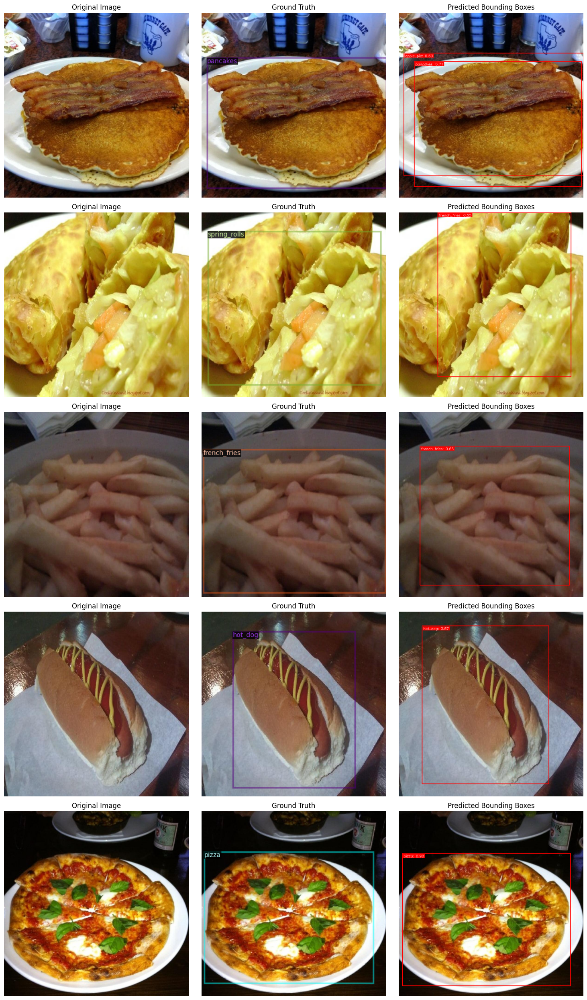

In [ ]:
random_images = random.sample(dataset_dicts, 5)  # Select 5 random images
visualize_output_in_table(random_images, predictions, food_metadata)

### **Pickle Model for future predictions**

In [ ]:
import pickle
import torch

# Save the trained model weights and configuration
def save_model(trainer, cfg, output_dir):
    # Save model weights
    model_weights_path = os.path.join(output_dir, "model_final.pth")
    torch.save(trainer.model.state_dict(), model_weights_path)
    print(f"Model weights saved to {model_weights_path}")

    # Save configuration
    config_path = os.path.join(output_dir, "config.pkl")
    with open(config_path, "wb") as f:
        pickle.dump(cfg, f)
    print(f"Model configuration saved to {config_path}")

# Load the model weights and configuration for future predictions
def load_model(output_dir):
    # Load configuration
    config_path = os.path.join(output_dir, "config.pkl")
    with open(config_path, "rb") as f:
        cfg = pickle.load(f)
    print(f"Model configuration loaded from {config_path}")

    # Load model weights
    model_weights_path = os.path.join(output_dir, "model_final.pth")
    cfg.MODEL.WEIGHTS = model_weights_path
    print(f"Model weights loaded from {model_weights_path}")

    # Create predictor
    predictor = DefaultPredictor(cfg)
    return predictor,cfg

# Save the model
save_model(trainer, cfg_fast_rcnn, cfg_fast_rcnn.OUTPUT_DIR)

Model weights saved to /content/drive/MyDrive/shortcuts/Capstone/output_food_detection_faster_rcnn/model_final.pth
Model configuration saved to /content/drive/MyDrive/shortcuts/Capstone/output_food_detection_faster_rcnn/config.pkl


## **Mask RCNN Model**

In [ ]:
# Configure the Mask R-CNN model for object detection
cfg_mask_rcnn = get_cfg()
cfg_mask_rcnn.merge_from_file(
    model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
)  # Use Mask R-CNN backbone for object detection
cfg_mask_rcnn.DATASETS.TRAIN = ("food_train",)
cfg_mask_rcnn.DATASETS.TEST = ("food_val",)
cfg_mask_rcnn.DATALOADER.NUM_WORKERS = 4
cfg_mask_rcnn.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
    "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
)  # Pretrained weights
cfg_mask_rcnn.SOLVER.IMS_PER_BATCH = 2
cfg_mask_rcnn.SOLVER.BASE_LR = 0.00025  # Learning rate
cfg_mask_rcnn.SOLVER.MAX_ITER = 3000  # Adjust based on dataset size
cfg_mask_rcnn.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg_mask_rcnn.MODEL.ROI_HEADS.NUM_CLASSES = len(food_metadata.thing_classes)  # Number of classes
cfg_mask_rcnn.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Threshold for predictions

# Disable mask prediction (only bounding box detection)
cfg_mask_rcnn.MODEL.MASK_ON = False

# Output directory
cfg_mask_rcnn.OUTPUT_DIR = captsone_project_path + "output_food_detection_mask_rcnn"
os.makedirs(cfg_mask_rcnn.OUTPUT_DIR, exist_ok=True)

In [ ]:
# Train the model
trainer = DefaultTrainer(cfg_mask_rcnn)
trainer.resume_or_load(resume=False)
trainer.train()


[06/11 20:54:17 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
model_final_f10217.pkl: 178MB [00:03, 50.4MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
  roi_heads.mask_head.mask_fcn1.{bias, weight}
  roi_heads.mask_head.mask_fcn2.{bias, weight}
  roi_heads.mask_head.mask_fcn3.{bias, weight}
  roi_heads.mask_head.mask_fcn4.{bias, weight}
  roi_heads.mask_head.deconv.{bias, weight}
  roi_heads.mask_head.predictor.{bias, weight}


[06/11 20:54:21 d2.engine.train_loop]: Starting training from iteration 0
[06/11 20:54:28 d2.utils.events]:  eta: 0:16:25  iter: 19  total_loss: 2.985  loss_cls: 2.486  loss_box_reg: 0.4614  loss_rpn_cls: 0.009444  loss_rpn_loc: 0.007784    time: 0.3451  last_time: 0.7432  data_time: 0.0438  last_data_time: 0.3993   lr: 4.9953e-06  max_mem: 2216M
[06/11 20:54:35 d2.utils.events]:  eta: 0:16:45  iter: 39  total_loss: 2.837  loss_cls: 2.364  loss_box_reg: 0.4569  loss_rpn_cls: 0.00724  loss_rpn_loc: 0.00707    time: 0.3505  last_time: 0.2865  data_time: 0.0167  last_data_time: 0.0060   lr: 9.9902e-06  max_mem: 2216M
[06/11 20:54:42 d2.utils.events]:  eta: 0:15:56  iter: 59  total_loss: 2.483  loss_cls: 2.006  loss_box_reg: 0.4873  loss_rpn_cls: 0.0132  loss_rpn_loc: 0.005357    time: 0.3424  last_time: 0.3179  data_time: 0.0069  last_data_time: 0.0051   lr: 1.4985e-05  max_mem: 2216M
[06/11 20:54:49 d2.utils.events]:  eta: 0:16:31  iter: 79  total_loss: 2.054  loss_cls: 1.62  loss_box_re

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [ ]:
# Evaluate the model
cfg_mask_rcnn.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Reduce threshold
# Create a test data loader
test_loader_mask_rcnn = build_detection_test_loader(cfg_mask_rcnn, "food_val")

# Create an evaluator
evaluator_mask_rcnn = COCOEvaluator("food_val", cfg_mask_rcnn, False, output_dir=cfg_mask_rcnn.OUTPUT_DIR)
trainer.test(cfg_mask_rcnn, trainer.model, evaluators=[evaluator_mask_rcnn])

predictor = DefaultPredictor(cfg_mask_rcnn)

WARNING [06/11 21:12:17 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/11 21:12:17 d2.data.datasets.coco]: Loaded 180 images in COCO format from /content/drive/MyDrive/shortcuts/Capstone/fooddetection-cap-cv3-may24b.v7i.coco/test/_annotations.coco.json
[06/11 21:12:17 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[06/11 21:12:17 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[06/11 21:12:17 d2.data.common]: Serializing 180 elements to byte tensors and concatenating them all ...
[06/11 21:12:17 d2.data.common]: Serialized dataset takes 0.06 MiB
WARNING [06/11 21:12:17 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [06/11 21:12:17 d2.data.datas

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[06/11 21:12:19 d2.evaluation.evaluator]: Inference done 11/180. Dataloading: 0.0059 s/iter. Inference: 0.0822 s/iter. Eval: 0.0003 s/iter. Total: 0.0884 s/iter. ETA=0:00:14
[06/11 21:12:24 d2.evaluation.evaluator]: Inference done 67/180. Dataloading: 0.0044 s/iter. Inference: 0.0851 s/iter. Eval: 0.0003 s/iter. Total: 0.0899 s/iter. ETA=0:00:10
[06/11 21:12:29 d2.evaluation.evaluator]: Inference done 127/180. Dataloading: 0.0031 s/iter. Inference: 0.0838 s/iter. Eval: 0.0003 s/iter. Total: 0.0872 s/iter. ETA=0:00:04
[06/11 21:12:33 d2.evaluation.evaluator]: Total inference time: 0:00:15.364600 (0.087798 s / iter per device, on 1 devices)
[06/11 21:12:33 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:14 (0.083905 s / iter per device, on 1 devices)
[06/11 21:12:33 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[06/11 21:12:33 d2.evaluation.coco_evaluation]: Saving results to /content/drive/MyDrive/shortcuts/Capstone/output_food_detection_mask_rc

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
  roi_heads.mask_head.mask_fcn1.{bias, weight}
  roi_heads.mask_head.mask_fcn2.{bias, weight}
  roi_heads.mask_head.mask_fcn3.{bias, weight}
  roi_heads.mask_head.mask_fcn4.{bias, weight}
  roi_heads.mask_head.deconv.{bias, weight}
  roi_heads.mask_head.predictor.{bias, weight}


#### **Model Metrics**

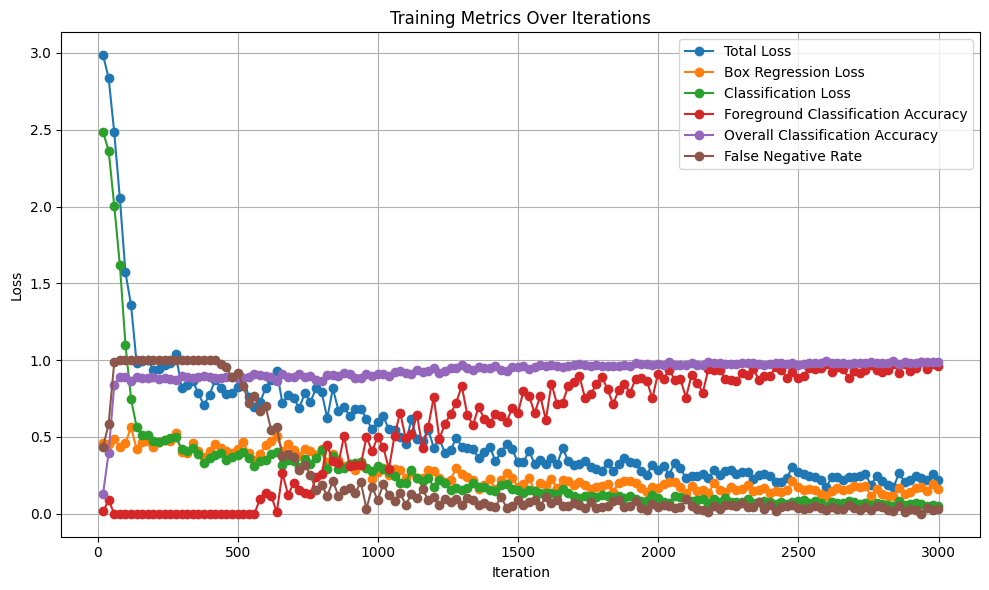

In [ ]:
import json
import matplotlib.pyplot as plt

# Path to evaluation results
metrics_path_mask_rcnn = captsone_project_path + "output_food_detection_mask_rcnn/metrics.json"

# Load metrics from the NDJSON evaluation results
def load_metrics_ndjson(metrics_path):
    metrics = []
    with open(metrics_path, "r") as f:
        for line in f:
            metrics.append(json.loads(line))  # Parse each line as a JSON object
    return metrics


# Plot metrics
def plot_metrics_ndjson(metrics):
    # Extract iterations and losses
    iterations = [m['iteration'] for m in metrics]
    total_loss = [m['total_loss'] for m in metrics]
    loss_box_reg = [m['loss_box_reg'] for m in metrics]
    loss_cls = [m['loss_cls'] for m in metrics]
    fg_cls_accuracy = [m['fast_rcnn/fg_cls_accuracy'] for m in metrics]
    cls_accuracy = [m['fast_rcnn/cls_accuracy'] for m in metrics]
    false_negative = [m['fast_rcnn/false_negative'] for m in metrics]


    # Plot total loss over iterations
    plt.figure(figsize=(10, 6))
    plt.plot(iterations, total_loss, label="Total Loss", marker="o")
    plt.plot(iterations, loss_box_reg, label="Box Regression Loss", marker="o")
    plt.plot(iterations, loss_cls, label="Classification Loss", marker="o")
    plt.plot(iterations, fg_cls_accuracy, label="Foreground Classification Accuracy", marker="o")
    plt.plot(iterations, cls_accuracy, label="Overall Classification Accuracy", marker="o")
    plt.plot(iterations, false_negative, label="False Negative Rate", marker="o")
    plt.xlabel("Iteration")
    plt.ylabel("Loss")
    plt.title("Training Metrics Over Iterations")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Load and showcase metrics
metrics_ndjson_mask_rcnn = load_metrics_ndjson(metrics_path_mask_rcnn)
plot_metrics_ndjson(metrics_ndjson_mask_rcnn)

#### **Observations**

 - Overall classification accuracy remained stable throught the training.
 - Total loss decrease throughout the training
 - In this model as well we observe the Classification Accuracy improved as number of iterations increase.

In [ ]:
# Run inference on the validation dataset
# Run inference and evaluation
results_mask_rcnn = inference_on_dataset(trainer.model, test_loader_mask_rcnn, evaluator_mask_rcnn)

[06/11 21:13:28 d2.evaluation.evaluator]: Start inference on 180 batches


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[06/11 21:13:30 d2.evaluation.evaluator]: Inference done 11/180. Dataloading: 0.0017 s/iter. Inference: 0.0913 s/iter. Eval: 0.0004 s/iter. Total: 0.0934 s/iter. ETA=0:00:15
[06/11 21:13:35 d2.evaluation.evaluator]: Inference done 65/180. Dataloading: 0.0030 s/iter. Inference: 0.0900 s/iter. Eval: 0.0003 s/iter. Total: 0.0935 s/iter. ETA=0:00:10
[06/11 21:13:40 d2.evaluation.evaluator]: Inference done 121/180. Dataloading: 0.0033 s/iter. Inference: 0.0884 s/iter. Eval: 0.0003 s/iter. Total: 0.0921 s/iter. ETA=0:00:05
[06/11 21:13:45 d2.evaluation.evaluator]: Inference done 180/180. Dataloading: 0.0028 s/iter. Inference: 0.0866 s/iter. Eval: 0.0003 s/iter. Total: 0.0898 s/iter. ETA=0:00:00
[06/11 21:13:45 d2.evaluation.evaluator]: Total inference time: 0:00:15.806809 (0.090325 s / iter per device, on 1 devices)
[06/11 21:13:45 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:15 (0.086563 s / iter per device, on 1 devices)
[06/11 21:13:45 d2.evaluation.coco_evaluation]: 

In [ ]:
print("Evaluation Results:")
for key, value in results_mask_rcnn.items():
    if isinstance(value, dict):  # Handle nested dictionaries
        print(f"{key}:")
        for sub_key, sub_value in value.items():
            print(f"  {sub_key}: {sub_value:.4f}" if isinstance(sub_value, (int, float)) else f"  {sub_key}: {sub_value}")
    else:
        print(f"{key}: {value:.4f}" if isinstance(value, (int, float)) else f"{key}: {value}")

Evaluation Results:
bbox:
  AP: 40.2105
  AP50: 57.1056
  AP75: 46.4512
  APs: nan
  APm: nan
  APl: 40.2105
  AP-food-detection: nan
  AP-apple_pie: 18.8203
  AP-chocolate_cake: 39.3929
  AP-french_fries: 37.8963
  AP-hot_dog: 35.8048
  AP-ice_cream: 25.4071
  AP-nachos: 54.1267
  AP-onion_rings: 54.2525
  AP-pancakes: 46.2118
  AP-pizza: 81.0891
  AP-ravioli: 34.5932
  AP-samosa: 32.7796
  AP-spring_rolls: 22.1515


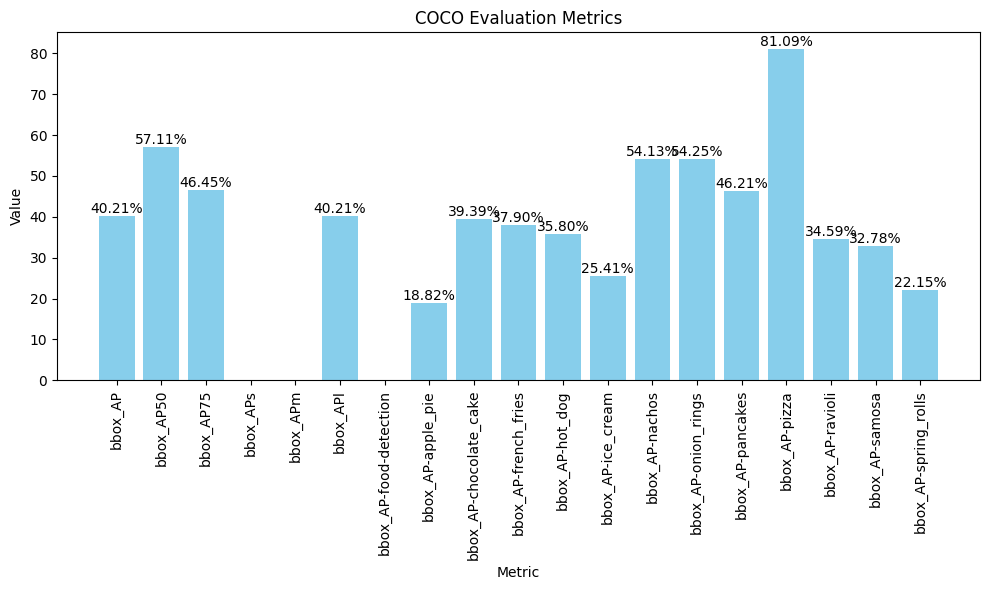

In [ ]:
flattened_results = {}
for key, value in results_mask_rcnn.items():
    if isinstance(value, dict):  # Handle nested dictionaries
        for sub_key, sub_value in value.items():
            flattened_results[f"{key}_{sub_key}"] = sub_value
    else:
        flattened_results[key] = value

# Extract keys and values for plotting
keys = list(flattened_results.keys())
values = [flattened_results[key] for key in keys]

# Create a bar chart
plt.figure(figsize=(10, 6))
bars = plt.bar(keys, values, color="skyblue")

# Add percentage labels on top of the bars
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,  # X-coordinate
        height + 0.01,  # Y-coordinate (slightly above the bar)
        f"{height :.2f}%",  # Format as percentage
        ha="center",  # Horizontal alignment
        va="bottom",  # Vertical alignment
        fontsize=10,  # Font size
        color="black"  # Text color
    )
plt.title("COCO Evaluation Metrics")
plt.xlabel("Metric")
plt.ylabel("Value")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

#### **Observation**
 - Overall **Bounding Box Average Precision is 40.21% higher that the Faster RCNN Model**. The average precision is a solid start for the model
 - Bounding Box Average Precision is highest for pizza 81.09%, followed by onion_rings 54.25%, nachos 54.13%, pancakes 46.21% and choclate cake 39.39%
 - Classes like apple pie with Average Precision 18.82%, samosa 32.78%, spring_rolls 22.60% were lowest performing
 - Overall the Mask RCNN model perfroms better than te Faster RCNN based better average precison and also better performance of classes which have low performance

In [ ]:
# Load Predicted annotated file generated by above predictor
results_path = captsone_project_path + "output_food_detection_mask_rcnn/coco_instances_results.json"

# Load the predictions from the JSON file
with open(results_path, "r") as f:
    predictions_mask_rcnn = json.load(f)

dataset_dicts_validation = DatasetCatalog.get("food_val")

WARNING [06/11 21:23:13 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/11 21:23:13 d2.data.datasets.coco]: Loaded 180 images in COCO format from /content/drive/MyDrive/shortcuts/Capstone/fooddetection-cap-cv3-may24b.v7i.coco/test/_annotations.coco.json


### **Detect Objects and Visualize the Results**

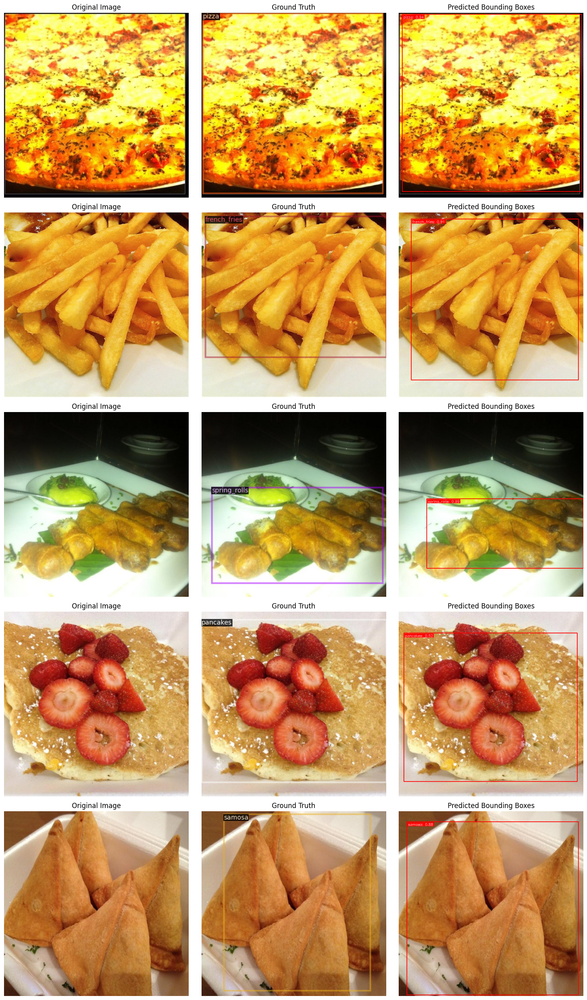

In [ ]:
# Visualize the output in tabular format
random_images_validation = random.sample(dataset_dicts_validation, 5)  # Select 5 random images
visualize_output_in_table(random_images_validation, predictions_mask_rcnn, food_metadata)

#### **Pickle Model for future predictions**

In [ ]:
import pickle
import torch

# Save the trained model weights and configuration
def save_model(trainer, cfg, output_dir):
    # Save model weights
    model_weights_path = os.path.join(output_dir, "model_final.pth")
    torch.save(trainer.model.state_dict(), model_weights_path)
    print(f"Model weights saved to {model_weights_path}")

    # Save configuration
    config_path = os.path.join(output_dir, "config.pkl")
    with open(config_path, "wb") as f:
        pickle.dump(cfg, f)
    print(f"Model configuration saved to {config_path}")

# Load the model weights and configuration for future predictions
def load_model(output_dir):
    # Load configuration
    config_path = os.path.join(output_dir, "config.pkl")
    with open(config_path, "rb") as f:
        cfg = pickle.load(f)
    print(f"Model configuration loaded from {config_path}")

    # Load model weights
    model_weights_path = os.path.join(output_dir, "model_final.pth")
    cfg.MODEL.WEIGHTS = model_weights_path
    print(f"Model weights loaded from {model_weights_path}")

    # Create predictor
    predictor = DefaultPredictor(cfg)
    return predictor

# Save the model
save_model(trainer, cfg_mask_rcnn, cfg_mask_rcnn.OUTPUT_DIR)

Model weights saved to /content/drive/MyDrive/shortcuts/Capstone/output_food_detection_mask_rcnn/model_final.pth
Model configuration saved to /content/drive/MyDrive/shortcuts/Capstone/output_food_detection_mask_rcnn/config.pkl


# Clickable GUI (Runs in local system)

- Using Stream lit to create a clickable GUI
- The GUI runs in localhost http://localhost:8501/
- GUI has a browse option to select and input image
- Once the image is loaded the orignal image and the predictions are displayed side by side along with class label and confidence intervals
- Screenshot below

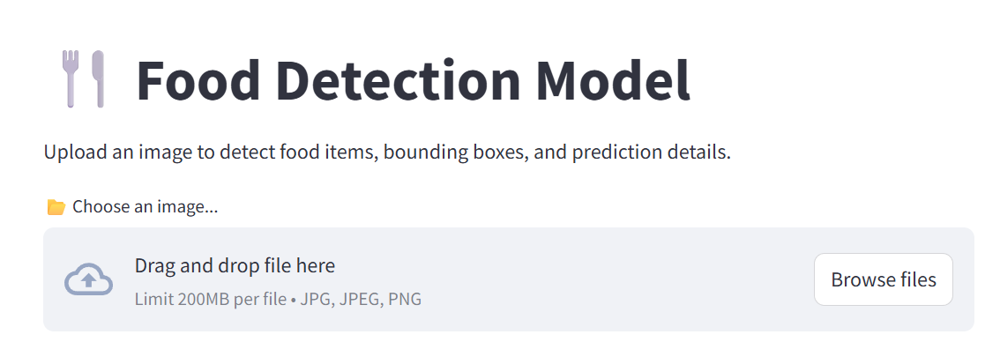

In [ ]:
!pip install streamlit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 39.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 49.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 8.6 MB/s eta 0:00:00


#### GUI Code

In [ ]:
import streamlit as st
import os
import cv2
import numpy as np
from PIL import Image
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
import pickle
import warnings
from detectron2.data import MetadataCatalog
from detectron2.utils.visualizer import ColorMode

# Suppress PyTorch warnings
warnings.filterwarnings("ignore", category=UserWarning, module="torch")

# Disable Streamlit's file watcher
# st.set_option("server.fileWatcherType", "none")

# Define class names manually (ensure the order matches the training dataset)
class_names = ['food-detection',
 'apple_pie',
 'chocolate_cake',
 'french_fries',
 'hot_dog',
 'ice_cream',
 'nachos',
 'onion_rings',
 'pancakes',
 'pizza',
 'ravioli',
 'samosa',
 'spring_rolls']

# Create metadata for visualization
metadata = MetadataCatalog.get("food_detection_metadata")
metadata.thing_classes = class_names

# Load the model configuration and weights
@st.cache_resource
def load_model(output_dir):
    # Log the model loading process
    print('Loading Food detection Model...')

    # Load configuration
    config_path = os.path.join(output_dir, "config.pkl")
    with open(config_path, "rb") as f:
        cfg = pickle.load(f)
    print(f"Model configuration loaded from {config_path}")

    # Load model weights
    model_weights_path = os.path.join(output_dir, "model_final.pth")
    cfg.MODEL.WEIGHTS = model_weights_path
    print(f"Model weights loaded from {model_weights_path}")

    # Force the model to run on the CPU
    cfg.MODEL.DEVICE = "cpu"

    # Create predictor
    predictor = DefaultPredictor(cfg)
    print('Loaded Food detection Model')
    return predictor, cfg

# Define paths
output_dir = "output_food_detection_mask_rcnn"

# Load the model once
predictor, cfg = load_model(output_dir)

# Streamlit UI
st.markdown("# 🍴 Food Detection Model")
st.markdown("Upload an image to detect food items, bounding boxes, and prediction details.")

# File uploader
uploaded_file = st.file_uploader("### 📂 Choose an image...", type=["jpg", "jpeg", "png"])

if uploaded_file is not None:
    # Convert the uploaded file to a temporary file path
    temp_file_path = os.path.join("temp_uploaded_image.jpg")
    with open(temp_file_path, "wb") as f:
        f.write(uploaded_file.getbuffer())

    # Load the image using cv2
    image = cv2.imread(temp_file_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for visualization

    # Run the model on the image
    outputs = predictor(image)

    # Extract prediction details
    instances = outputs["instances"].to("cpu")
    prediction_details = []
    if "instances" in outputs:
        for i in range(len(instances)):
            class_id = instances.pred_classes[i].item()
            class_name = class_names[class_id]  # Map class ID to class name
            score = instances.scores[i].item()
            prediction_details.append(f"{class_name}: {score:.2f}%")

    # Visualize the predictions with distinct bounding boxes
    visualizer = Visualizer(
        image_rgb[:, :, ::-1],  # Convert RGB to BGR for visualization
        metadata=metadata,
        scale=0.8,  # Adjust scale for better visualization
        instance_mode=ColorMode.IMAGE  # Keep the background in color
    )

    predicted_image = image.copy()

    # Customize bounding box thickness and color based on image background
    instances = outputs["instances"].to("cpu")
    for i in range(len(instances)):
        box = instances.pred_boxes[i].tensor.numpy()[0]  # Extract bounding box coordinates
        class_id = instances.pred_classes[i].item()
        class_name = class_names[class_id]
        score = instances.scores[i].item()

        # Calculate average brightness of the image to decide border color
        avg_brightness = np.mean(predicted_image)
        border_color = (0, 0, 0) if avg_brightness > 128 else (255, 255, 255)  # Black for bright images, white for dark images

        # Draw bounding box with dynamic color and thickness
        x1, y1, x2, y2 = map(int, box)
        cv2.rectangle(predicted_image, (x1, y1), (x2, y2), border_color, thickness=10)  # Dynamic border color with thickness 6

        # Add class name and confidence score as label with a background
        label = f"{class_name}: {score:.2f}"

        # Get the text size to calculate the rectangle dimensions
        (text_width, text_height), baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, fontScale=3.5, thickness=16)

        # Define the rectangle coordinates
        rect_x1, rect_y1 = x1, y1 - text_height - 10  # Top-left corner of the rectangle
        rect_x2, rect_y2 = x1 + text_width, y1  # Bottom-right corner of the rectangle

        # Draw the rectangle (background) with a contrasting color
        background_color = (255, 255, 255) if border_color == (0, 0, 0) else (0, 0, 0)  # White for black borders, black for white borders
        cv2.rectangle(predicted_image, (rect_x1, rect_y1), (rect_x2, rect_y2), background_color, thickness=-1)  # Filled rectangle

        # Draw the text on top of the rectangle
        cv2.putText(predicted_image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, fontScale=3.5, color=border_color, thickness=16)

    # Convert the image back to RGB for visualization
    predicted_image_rgb = predicted_image[:, :, ::-1]  # Reverse the color channels (BGR to RGB)
    # Create three columns for input, output, and prediction details
    col1, col2, col3 = st.columns([3, 3, 1.4])  # Adjust proportions: col1 and col2 are larger than col3

    # Display the original image in the first column
    with col1:
        st.markdown("### 🖼️ Uploaded Image")
        st.image(image_rgb, use_container_width=True)

    # Display the predicted image in the second column
    with col2:
        st.markdown("### 📊 Predicted Output")
        # Convert the predicted image from BGR to RGB
        #predicted_image_rgb = vis.get_image()[:, :, ::-1]
        st.image(predicted_image_rgb, use_container_width=True)

    # Display the prediction details in the third column
    with col3:
        st.markdown("### 🔍Details")
        for detail in prediction_details:
            # Split the class name and confidence score
            class_name, confidence = detail.split(":")
            # Remove the '%' symbol and convert confidence to percentage
            confidence_value = float(confidence.strip().replace('%', '')) * 100
            st.markdown(f"**:blue[{class_name.strip()}]**: {confidence_value:.2f}%")

2025-06-12 22:19:14.614 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-12 22:19:14.614 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-12 22:19:14.615 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


Loading Food detection Model...


2025-06-12 22:19:15.116 Thread 'Thread-10': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-12 22:19:15.118 Thread 'Thread-10': missing ScriptRunContext! This warning can be ignored when running in bare mode.


Model configuration loaded from /content/drive/MyDrive/shortcuts/Gr 6 CV3 - CapStone Project/Capstone_Project/output_food_detection_mask_rcnn/config.pkl
Model weights loaded from /content/drive/MyDrive/shortcuts/Gr 6 CV3 - CapStone Project/Capstone_Project/output_food_detection_mask_rcnn/model_final.pth


2025-06-12 22:19:24.153 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-12 22:19:24.154 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-12 22:19:24.155 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-12 22:19:24.156 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-12 22:19:24.157 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-12 22:19:24.158 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-12 22:19:24.159 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-12 22:19:24.159 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bar

Loaded Food detection Model


#### Sample Prediction in the GUI

- Screenshot below

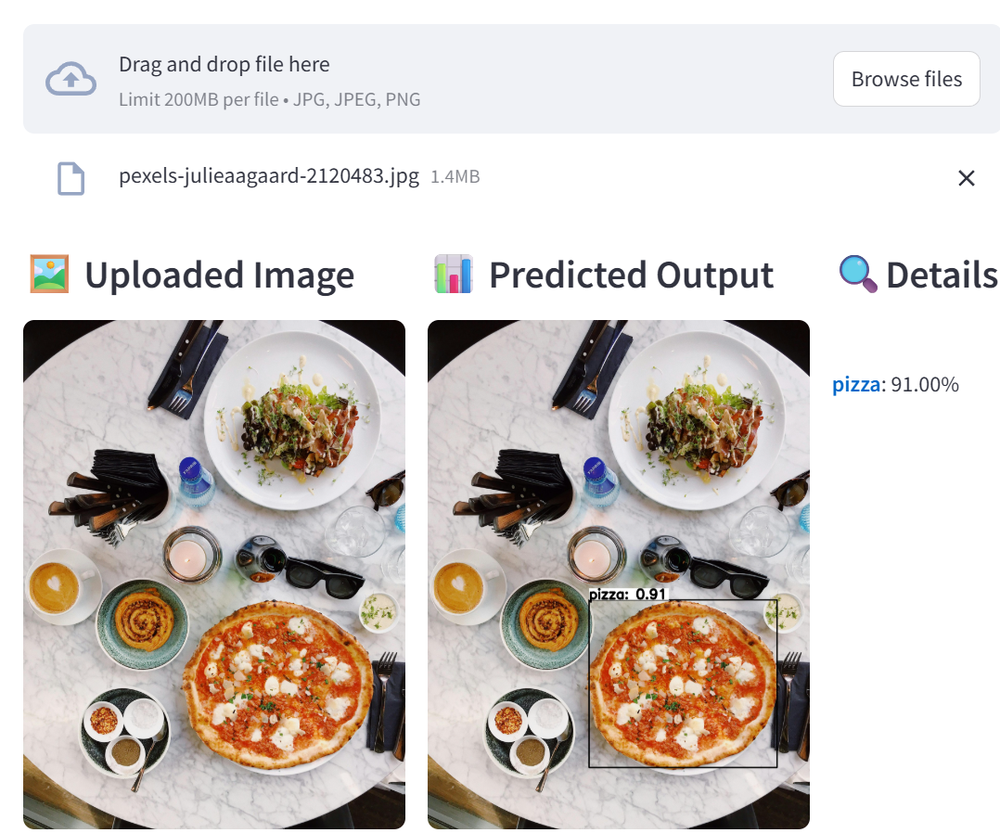

# **Insights and Recommendations**


**Insights & Observations** </br></br>
***EfficientNet for Food Classification:***</br>

EfficientNet's compound scaling allows it to achieve high accuracy with fewer parameters, making it efficient for classification tasks involving large food datasets.

Shows strong performance in recognizing fine-grained food categories, especially when trained on well-annotated datasets like Food-101, UECFood100, or VFN.

***Faster R-CNN vs. Mask R-CNN for Food Detection:***

Both models yielded comparable precision and accuracy, with Mask R-CNN performing marginally better due to its additional segmentation capabilities.

Mask R-CNN's pixel-level precision helps disambiguate overlapping or occluded food items more effectively than Faster R-CNN.

# **Recommendations for Model Improvements** </br></br>
***Model Enhancements:*** </br>

<u>Replace EfficientNet with CoAtNet or ConvNeXt:</u>

These models outperform EfficientNet in fine-grained classification and may offer better generalization.

<u>Use hybrid detectors like DETR or DINO:</u>

Transformer-based models like DETR (DEtection TRansformer) and DINO offer state-of-the-art object detection performance with better contextual understanding and fewer hand-crafted components.

<u>Instance Segmentation + Depth Estimation:</u>

Integrating monocular depth estimation (e.g., MiDaS) with Mask R-CNN could improve detection in cluttered environments by incorporating spatial cues.

***Training Improvements:***

<u>Augmentation strategies:</u>

Use domain-specific augmentations like lighting variation, occlusion simulation, or synthetic plating for food datasets.

<u>Semi-supervised learning:</u>

Leverage unlabelled food images using pseudo-labelling or contrastive learning approaches (e.g., SimCLR, BYOL) to enhance performance with limited annotations.

<u>Post-Processing & Metrics:</u>

Implement non-maximum suppression (NMS) refinements like Soft-NMS or DIoU-NMS for better handling of overlapping predictions.

Evaluate not just with mAP but also IoU variance across classes, especially for fine-grained food items.

# **Industry Applications and Use Cases** </br></br>

***Quick Service Restaurants (QSRs) & Cloud Kitchens:***

<u>Use Case 1:</u> Real-time tray detection for automated quality checks or portion control.

<u>Requirement:</u> High accuracy and precision (Mask R-CNN recommended).

***Smart Canteens & Automated Buffet Billing:***

<u>Use Case 2:</u> Auto-identify food items on trays for billing without manual input.

<u>Requirement:</u> Moderate-to-high accuracy; real-time response favored (lightweight Mask R-CNN or YOLOv8-seg could be beneficial).

***Diet Monitoring & Health Tech:***

<u>Use Case 3:</u> Smartphone-based food logging apps with visual detection.

<u>Requirement:</u> Lightweight models with acceptable accuracy (MobileNet + YOLOv5 or YOLO-NAS).

***Waste Management & Food Recognition for Sustainability:***

<u>Use Case 4:</u> Segregation of leftover food types for recycling or composting.

<u>Requirement:</u> Emphasis on robustness under poor lighting or occlusion (Mask R-CNN or DETR with attention-based models).

***Retail & Supermarkets:***

<u>Use Case 5:</u> Self-checkout systems recognizing unpackaged fresh foods.

<u>Requirement:</u> High precision to avoid billing errors (DETR, DINO, Mask R-CNN).